In [1]:
import scanpy as sc
import numpy as np
import anndata as ad
import scanpy as sc
import igraph
import ALLCools
from ALLCools.integration.seurat_class import SeuratIntegration
import scanpy._utils as sc_utils 
import networkx as nx
import metis
import pandas as pd
import matplotlib.pyplot as plt
import scipy.sparse
import anndata
import os
from scipy.stats import zscore
import seaborn as sns

In [2]:
import numpy as np
import anndata as ad
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import anndata
import seaborn as sns
import scvelo as scv 

In [2]:
#DR1_2

In [3]:
DR1_2= sc.read_h5ad('/mnt/f/spatial/DR1_2.h5ad')

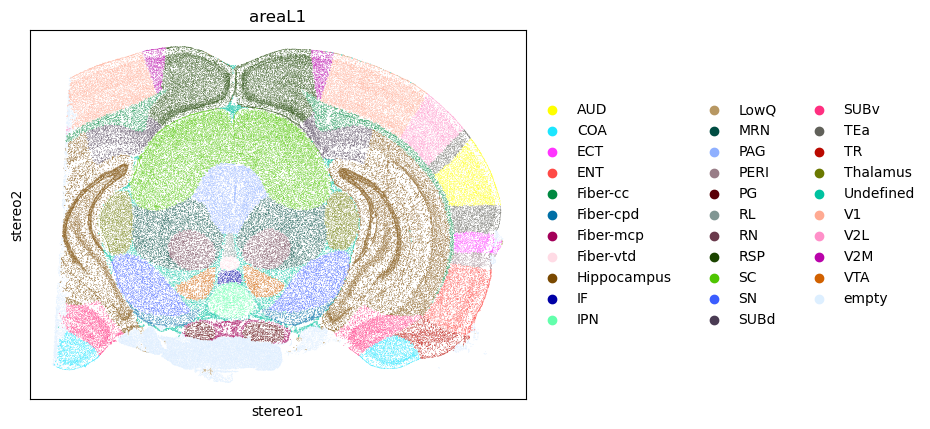

In [4]:
sc.pl.embedding(DR1_2, basis='stereo',color='areaL1')

In [5]:
DR1_2_V1 = DR1_2[DR1_2.obs['areaL1']=='V1']

In [6]:
DR1_2_V1R = DR1_2_V1[DR1_2_V1.obs['left_right']=='right']

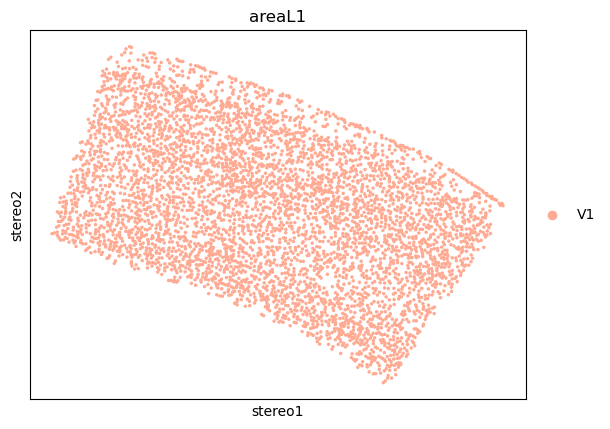

In [7]:
sc.pl.embedding(DR1_2_V1R, basis='stereo',color='areaL1')

In [8]:
D_V1_Sn = sc.read_h5ad('/mnt/f/RNA_velocity/V1/DR_V1_ann_filter.h5ad')

In [27]:
D_V1_Sn

View of AnnData object with n_obs × n_vars = 15009 × 21987
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Class_colors', 'Sample_colors', 'Subclass_colors', 'Subtype_colors', 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'preclass_colors', 'umap', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [9]:
# Consider the common genes
common_genes = np.array(D_V1_Sn.var_names.intersection(DR1_2_V1R.var_names))

In [10]:
def get_sparse_from_igraph(graph, weight_attr=None):
    from scipy.sparse import csr_matrix

    edges = graph.get_edgelist()
    if weight_attr is None:
        weights = [1] * len(edges)
    else:
        weights = graph.es[weight_attr]
    if not graph.is_directed():
        edges.extend([(v, u) for u, v in edges])
        weights.extend(weights)
    shape = graph.vcount()
    shape = (shape, shape)
    if len(edges) > 0:
        return csr_matrix((weights, zip(*edges)), shape=shape)
    else:
        return csr_matrix(shape)

In [11]:
def partition_subclasses(adata, n_partitions):
    '''Assign integration partitions as the adata.obs['integration_partion'] column.'''
    adata.obs['integration_partition'] = 'p0'
    
    # Get a sparse matrix of that counts edges between subclasses
    ones = adata.obsp['distances'].copy()
    ones.data = np.ones(len(ones.data))

    g_neighobrs = sc._utils.get_igraph_from_adjacency(ones, directed=True)
    vc = igraph.VertexClustering(g_neighobrs, membership=adata.obs['Subclass'].cat.codes.values)
    cluster_mtx = get_sparse_from_igraph(vc.cluster_graph(combine_edges='sum'), weight_attr='weight')
    
    # Partition the cluster level graph
    G_cluster = nx.from_scipy_sparse_array(cluster_mtx)
    for i in adata.obs['Subclass'].cat.codes.values:
        G_cluster.nodes[i]['weight'] = np.sum(adata.obs['Subclass'] 
                                              == adata.obs['Subclass'].cat.categories[i] )
    G_cluster.graph['node_weight_attr'] = 'weight'
    
    (cut, parts) = metis.part_graph(G_cluster, n_partitions, recursive=False,
                                   tpwgts=[1 / n_partitions] * n_partitions) 
    
    # Assign the partitions
    for i in range(len(parts)):
        mask = (adata.obs['Subclass'] == adata.obs['Subclass'].cat.categories[i])
        adata.obs.loc[mask, 'integration_partition'] = 'p' + str(parts[i])
    
    adata.obs['integration_partition'] = adata.obs['integration_partition'].astype('category')
    
import scipy.sparse
def get_cluster_mean_expression_matrix(adata, cluster_column):
    '''Get a dataframe of mean gene expression of each cluster.'''
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
   
    cell_exp_mtx = pd.DataFrame(X, index=adata.obs[cluster_column], columns=adata.var.index)    
    return cell_exp_mtx.groupby(by=cluster_column).mean()

def calculate_correlation_matrix(adata, cluster_column):
    '''Calculate gene expression correlations between clusters.'''
    cluster_mean_exp = get_cluster_mean_expression_matrix(adata, cluster_column)
    
    # Initialzie the correlation matrix
    cluster_ids = np.array(cluster_mean_exp.index)
    N_clusters = len(cluster_ids)
    correlation_mtx = pd.DataFrame(np.ones((N_clusters, N_clusters)), index=cluster_ids, columns=cluster_ids)
    
    # Fill the correlation matrix
    for i in range(N_clusters):
        cluster_id1 = cluster_ids[i]
        mean_exps1 = np.array(cluster_mean_exp.loc[cluster_id1])
        
        for j in range(i + 1, N_clusters):
            cluster_id2 = cluster_ids[j]
            mean_exps2 = np.array(cluster_mean_exp.loc[cluster_id2])
            
            r, p = scipy.stats.pearsonr(mean_exps1, mean_exps2)

            correlation_mtx.loc[cluster_id1, cluster_id2] = r
            correlation_mtx.loc[cluster_id2, cluster_id1] = r
            
    return correlation_mtx

def merge_clusters(obs_df, cluster_col, clusters_to_merge):
    merged_cluster_id = sorted(clusters_to_merge)[0]
    obs_df[cluster_col][obs_df[cluster_col].isin(clusters_to_merge)] = merged_cluster_id
    obs_df[cluster_col] = obs_df[cluster_col].cat.remove_unused_categories()

In [12]:
%%time
# Define the integration partitions using the sequencing data
n_partitions = 200

# 标准化并检查数据
sc.pp.normalize_total(D_V1_Sn, target_sum=1000)


# 对数转换并检查数据
sc.pp.log1p(D_V1_Sn)


# 缩放并防止除以零的情况
sc.pp.scale(D_V1_Sn, zero_center=False)


# PCA降维
n_pcs = 100
sc.tl.pca(D_V1_Sn, svd_solver='arpack', n_comps=n_pcs)


# 计算neighbors
sc.pp.neighbors(D_V1_Sn, use_rep='X_pca', n_neighbors=25, n_pcs=n_pcs)

# 分区并进行整合
partition_subclasses(D_V1_Sn, n_partitions)

# 后续的分区合并和处理
partition_corr_df = calculate_correlation_matrix(D_V1_Sn, 'integration_partition')
p_names, p_n_cells = np.unique(D_V1_Sn.obs['integration_partition'], return_counts=True)
p_smalls = p_names[p_n_cells < 10000]
p_larges = p_names[p_n_cells >= 10000]
partition_corr_df = partition_corr_df.loc[p_smalls, p_larges]

for p1 in p_smalls:
    # 检查 partition_corr_df.loc[p1] 是否为空
    if partition_corr_df.loc[p1].empty:
        print(f"Warning: partition {p1} has no corresponding large partition.")
        continue  # 跳过这个空的序列
    
    # 继续进行合并
    p2 = partition_corr_df.columns[np.argmax(partition_corr_df.loc[p1])]
    print(f'Merge partitions {p1} and {p2}')
    merge_clusters(D_V1_Sn.obs, 'integration_partition', [p1, p2])

seq_annotation_df = D_V1_Sn.obs.copy()


	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to partition a graph into too many parts!
	***Cannot bisect a graph with 0 vertices!
	***You are trying to

/tmp/ipykernel_263086/4169816286.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return cell_exp_mtx.groupby(by=cluster_column).mean()


CPU times: user 1min 2s, sys: 2.17 s, total: 1min 4s
Wall time: 22.3 s


In [13]:
%%time
# Reload the sequencing data and assign the partitions
D_V1_Sn.obs['integration_partition'] = seq_annotation_df['integration_partition']

D_V1_Sn.obs['Subclass'] = D_V1_Sn.obs['Subclass'].astype('category')
D_V1_Sn.obs['Type'] = D_V1_Sn.obs['Type'].astype('category')

D_V1_Sn = D_V1_Sn[~D_V1_Sn.obs['Type'].isna()]
D_V1_Sn = D_V1_Sn[~D_V1_Sn.obs['Subclass'].isna()]

CPU times: user 73.9 ms, sys: 90.2 ms, total: 164 ms
Wall time: 163 ms


In [14]:
%%time
# Split the sequencing data for the input of the final round of integration.
# Because imputation is done at this round, all genes are included.

partition_path = '/mnt/f/spatial/V1_integration/DR1_2/partitions/'

# 获取分区信息
partitions = D_V1_Sn.obs['integration_partition'].cat.categories

print('Partition, N_cells, subclasses')

# 遍历每个分区
for pn in partitions:
    # 根据分区选择子集数据
    adata_subset = D_V1_Sn[D_V1_Sn.obs['integration_partition'] == pn]
    
    # 替换路径中的不合法字符并生成保存路径
    partition_save_path = partition_path + pn.replace('/', '-').replace(' ', '_') + '/'
    
    # 自动创建目标文件夹，如果不存在则创建
    os.makedirs(partition_save_path, exist_ok=True)
    
    # 将子集数据保存到 .h5ad 文件
    save_file = partition_save_path + 'adata_seq.h5ad'
    adata_subset.write_h5ad(save_file, compression='gzip')
    
    # 打印分区的统计信息
    print(f'{pn}, {adata_subset.shape[0]}, {list(np.unique(adata_subset.obs["Subclass"]))}')


Partition, N_cells, subclasses
p124, 2978, ['L4/5 IT CTX']
p149, 679, ['L5 IT CTX']
p155, 524, ['Sst']
p161, 376, ['Vip']
p174, 837, ['Oligo']
p177, 67, ['ABC']
p180, 203, ['L5 NP CTX']
p186, 762, ['Astro']
p192, 460, ['Pvalb']
p195, 244, ['OPC']
p196, 110, ['Microglia']
p197, 66, ['VLMC']
p199, 243, ['Lamp5']
p49, 3166, ['L2/3 IT CTX']
p55, 233, ['L6b CTX']
p61, 805, ['L6 IT CTX']
p74, 1974, ['L6 CT CTX']
p99, 1282, ['L5 ET CTX']
CPU times: user 16.4 s, sys: 234 ms, total: 16.6 s
Wall time: 26.9 s


In [68]:
# Merge the datasets
DR_V1_merge = D_V1_Sn.concatenate(DR1_2_V1R,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None,join='outer')

/tmp/ipykernel_263086/2254870123.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  DR_V1_merge = D_V1_Sn.concatenate(DR1_2_V1R,
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [69]:
%%time
# Get the significant PCs
n_pcs = 11
sc.tl.pca(DR_V1_merge, svd_solver='arpack', n_comps=11)

CPU times: user 36.9 s, sys: 453 ms, total: 37.3 s
Wall time: 3.41 s


In [70]:
DR_V1_list = [DR_V1_merge[DR_V1_merge.obs['modality'] == 'seq'],
              DR_V1_merge[DR_V1_merge.obs['modality'] == 'spatial']]

In [71]:
%%time
# Find the integration anchors
integrator = SeuratIntegration()
integrator.find_anchor(DR_V1_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=50,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None,
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])

Find anchors across datasets.
Run CCA
non zero dims 11
Find Anchors using k=100
Score Anchors
Identified 191162 anchors between datasets 0 and 1.
CPU times: user 2min 50s, sys: 10.9 s, total: 3min
Wall time: 29.3 s


In [72]:
#label transfer
cell_type_col = 'integration_partition'

transfer_results = integrator.label_transfer(
    ref=[0],
    qry=[1],
    categorical_key=[cell_type_col],
    key_dist='X_pca',
    k_weight=100,
    npc=n_pcs)

integrator.save_transfer_results_to_adata(DR_V1_merge, transfer_results)

Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer


In [73]:
# Assign the transfered labels and the confidence
DR1_2_V1R.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1).astype('category')
DR1_2_V1R.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)

n_transfered = len(np.unique(DR1_2_V1R.obs[cell_type_col + '_transfer']))
n_total = len(np.unique(DR_V1_merge.obs[cell_type_col + '_transfer']))
print(f'Transfered {n_transfered}/{n_total} cell types.')

Transfered 18/18 cell types.


In [74]:
# Save the label transfer results for each class
partition_path = '/mnt/f/spatial/V1_integration/DR1_2/partitions/'


partitions = DR1_2_V1R.obs[cell_type_col + '_transfer'].unique()

cell_type_col = 'integration_partition'

for pn in partitions:

    adata_subset =DR1_2_V1R[DR1_2_V1R.obs[cell_type_col + '_transfer'] == pn]
    

    partition_save_path = partition_path + pn.replace('/', '-').replace(' ', '_') + '/'
    

    if not os.path.exists(partition_save_path):
        os.makedirs(partition_save_path, exist_ok=True)
    

    save_file = partition_save_path + 'adata_spatial_integrated.h5ad'
    

    adata_subset.write_h5ad(save_file, compression='gzip')
    

    print(f'Successfully saved for partition {pn} at: {save_file}')


Successfully saved for partition p196 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p196/adata_spatial_integrated.h5ad
Successfully saved for partition p197 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p197/adata_spatial_integrated.h5ad
Successfully saved for partition p186 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p186/adata_spatial_integrated.h5ad
Successfully saved for partition p177 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p177/adata_spatial_integrated.h5ad
Successfully saved for partition p49 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p49/adata_spatial_integrated.h5ad
Successfully saved for partition p155 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p155/adata_spatial_integrated.h5ad
Successfully saved for partition p99 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p99/adata_spatial_integrated.h5ad
Successfully saved for partition p161 at: /mnt/f/spatial/V1_integration/DR1_2/partitions/p161/adata_spatial_integrated.h5ad
Successfully

In [80]:
coembedding_umap_df = DR_V1_merge.obs[[]].copy()
coembedding_umap_df['umap_x'] = DR_V1_merge.obsm['X_umap'][:, 0]
coembedding_umap_df['umap_y'] = DR_V1_merge.obsm['X_umap'][:, 1]
coembedding_umap_df.to_csv('coembedding_umap.csv')

In [ ]:
#Integrate individual partitions

In [81]:
def impute_gene_expression(integrator, adata_list, X_ref, ref=0, qry=1, npc=30, k_weight=30, sd=1,
                           chunk_size=1000, random_state=0):
    data_qry = adata_list[qry].obsm['X_pca']

    anchor, G, D, cum_qry = integrator.find_nearest_anchor(adata_list, data_qry=data_qry, ref=[ref], qry=[qry],
                                                      npc=npc, k_weight=k_weight, sd=sd, random_state=random_state)
    
    if scipy.sparse.issparse(X_ref):
        X_ref = X_ref.toarray()
    
    X_anchor = X_ref[anchor[:, 0]]
    imputed_chunks = []
    
    for chunk_start in np.arange(0, data_qry.shape[0], chunk_size):
        imputed_chunks.append(scipy.sparse.csr_matrix((
                        D[chunk_start:(chunk_start + chunk_size), :, None] *
                        X_anchor[G[chunk_start:(chunk_start + chunk_size)]]
                    ).sum(axis=1).astype(np.float32)))

    return scipy.sparse.vstack(imputed_chunks)

Integrating for partition p124


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 41550 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 831 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


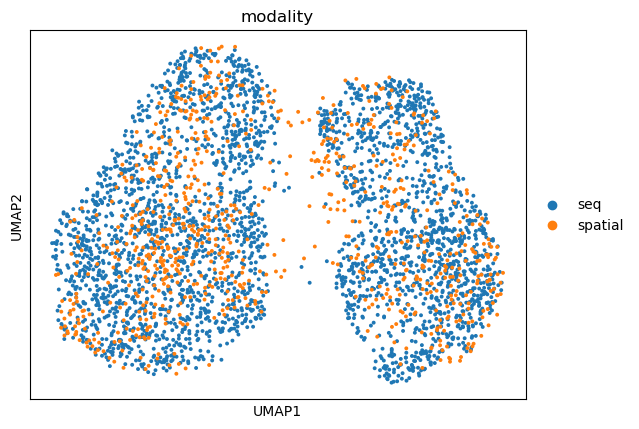

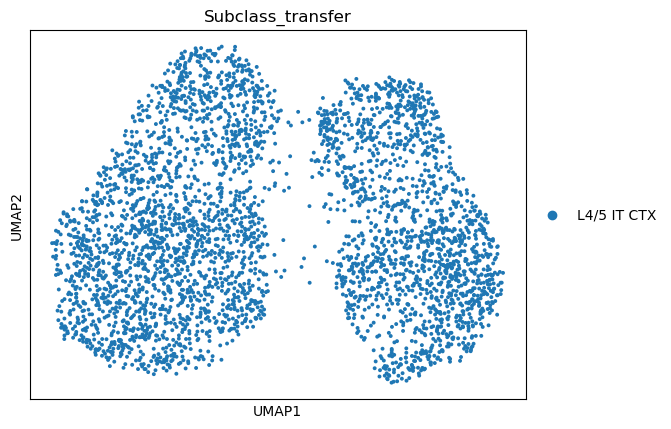

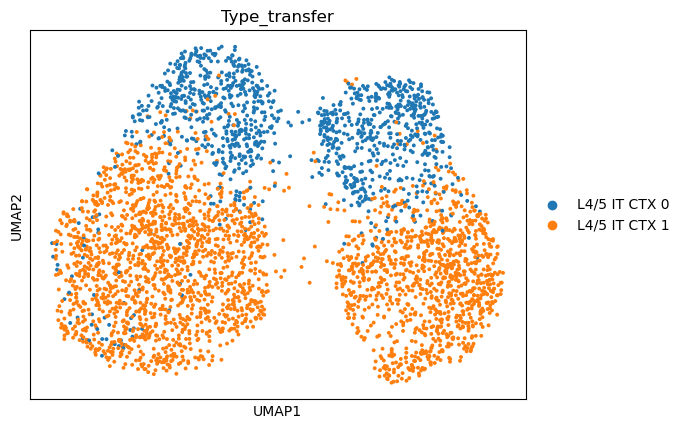

Integrating for partition p149


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 11600 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 232 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


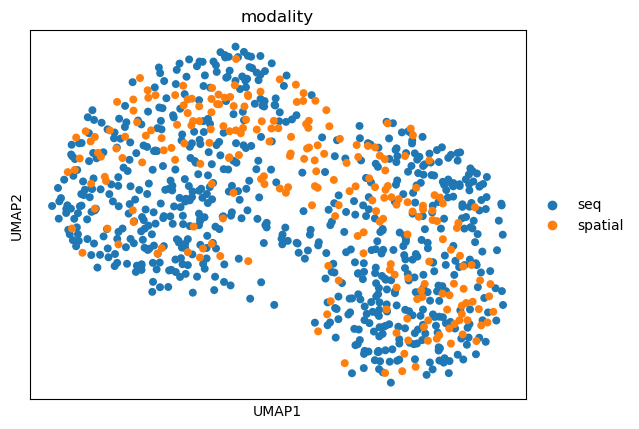

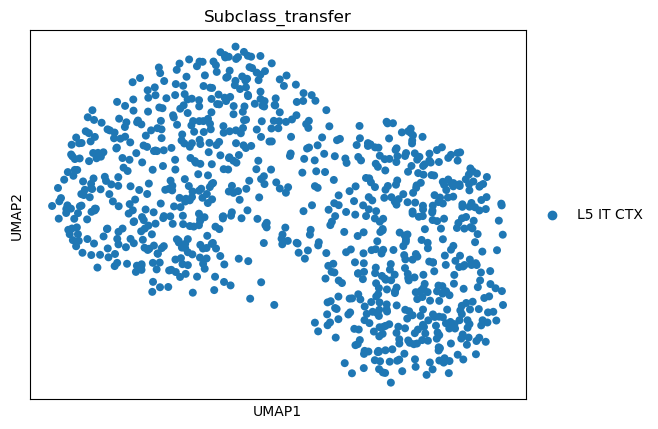

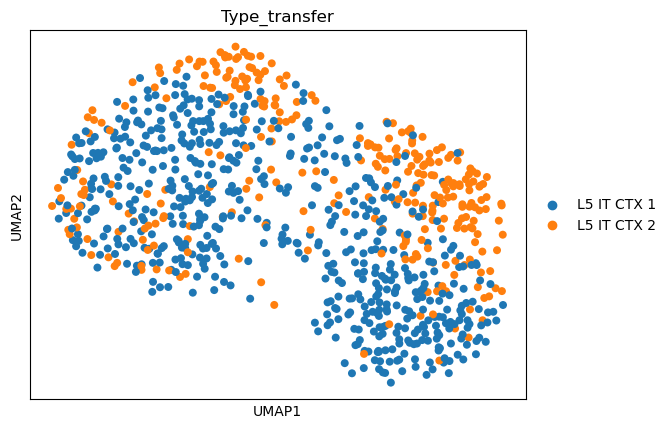

Integrating for partition p155


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 7100 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 3/4 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 142 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


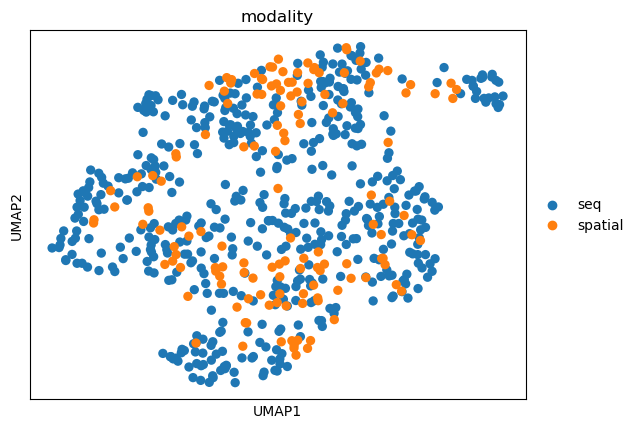

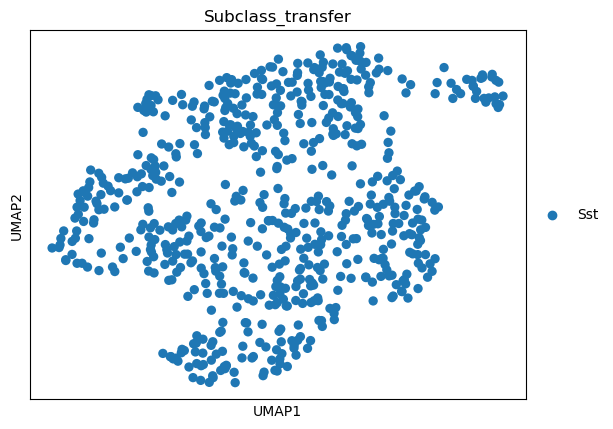

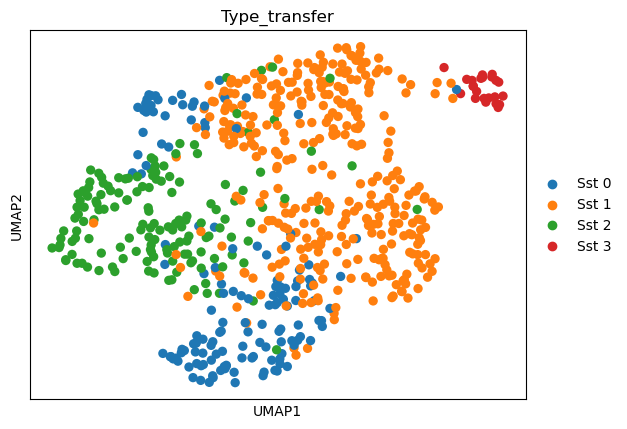

Integrating for partition p161


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=99
Score Anchors
Identified 5050 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 101 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


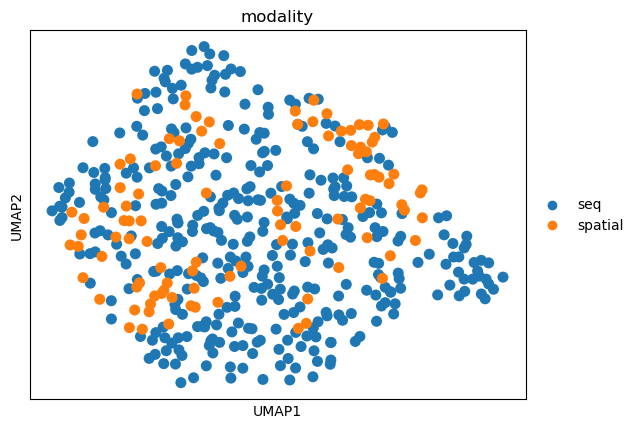

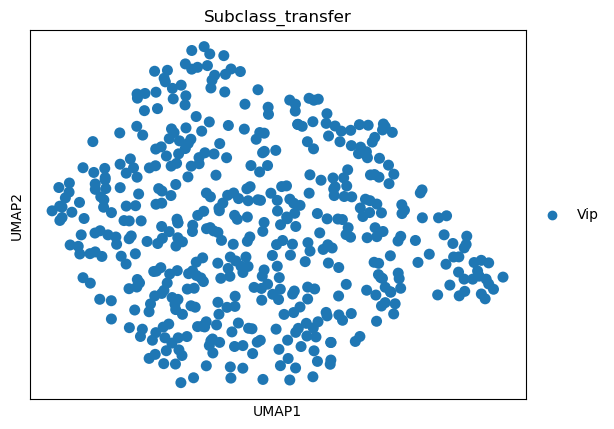

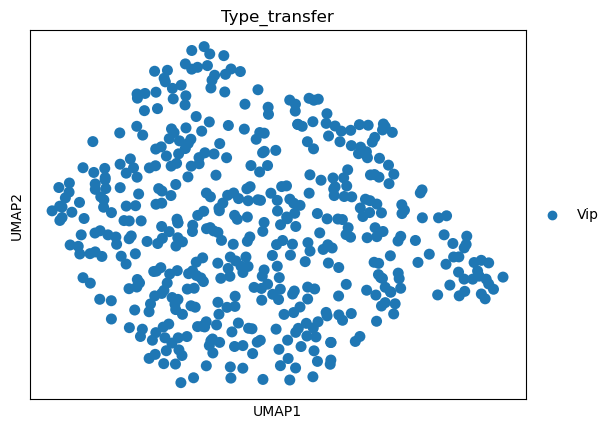

Integrating for partition p174


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 14200 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 284 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


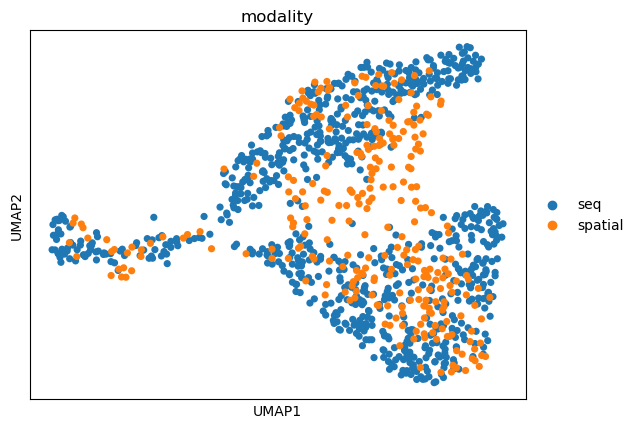

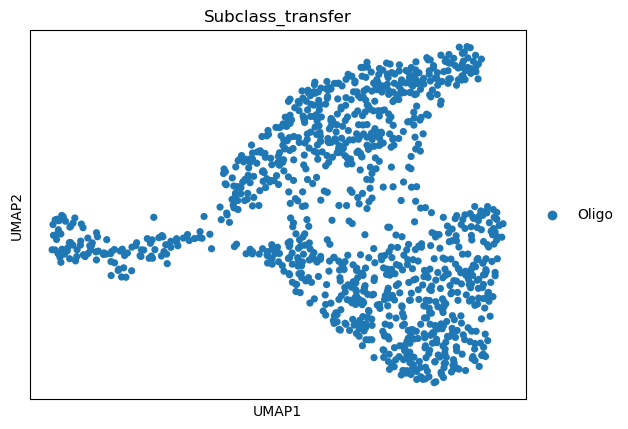

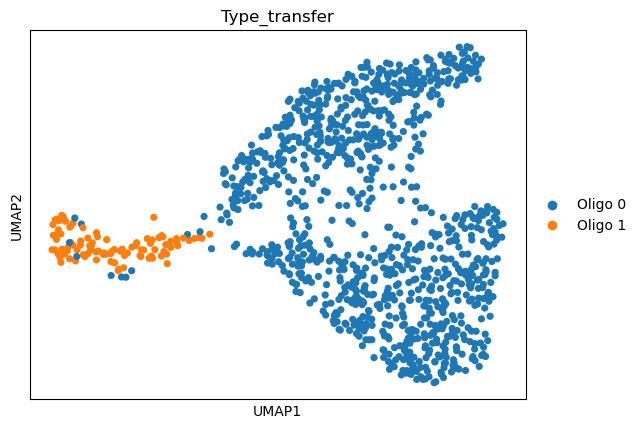

Integrating for partition p177


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=65
Score Anchors
Identified 3296 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/2 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 70 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


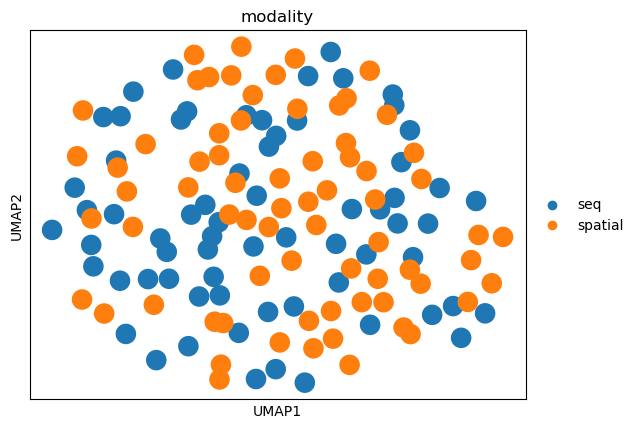

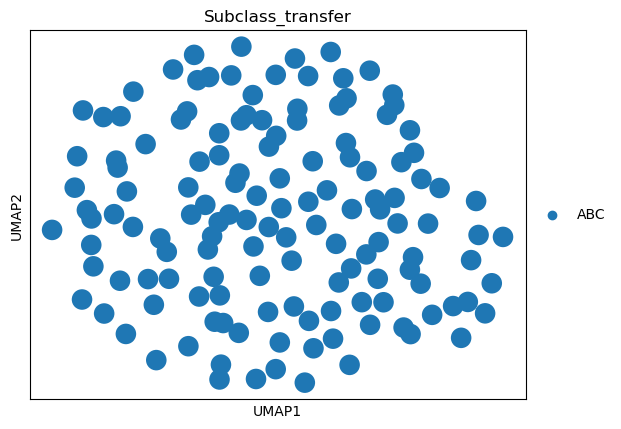

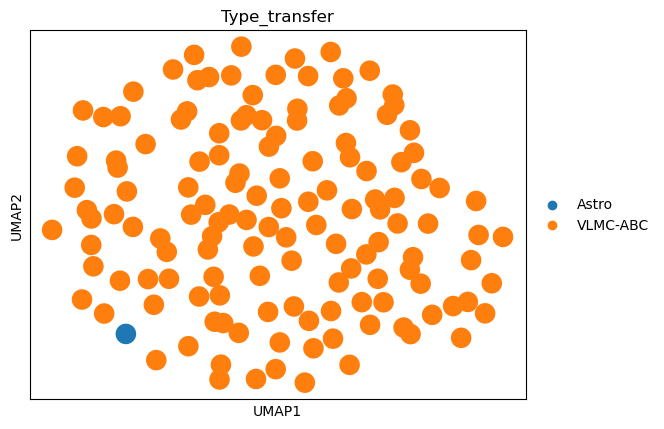

Integrating for partition p186


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 26420 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 531 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


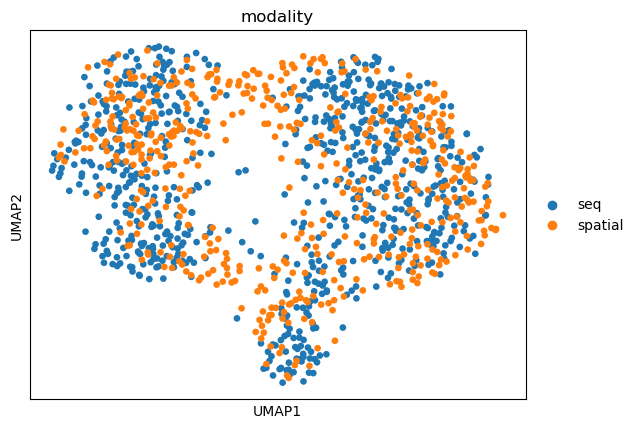

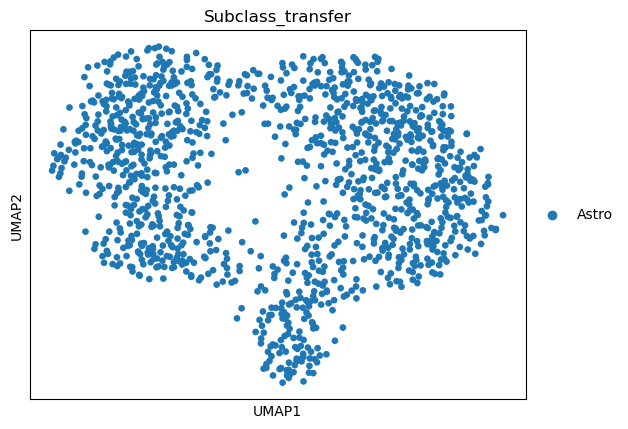

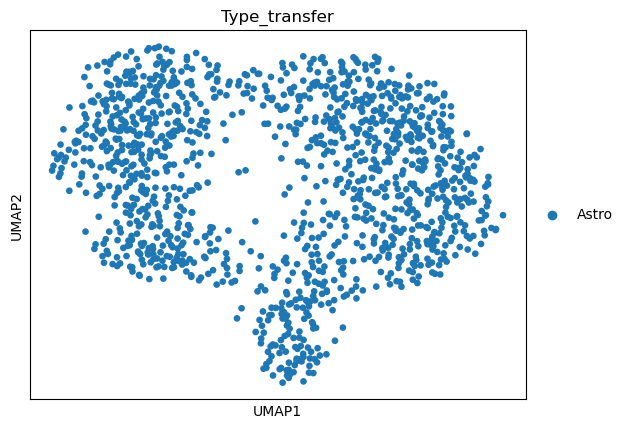

Integrating for partition p192


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 6650 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 133 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


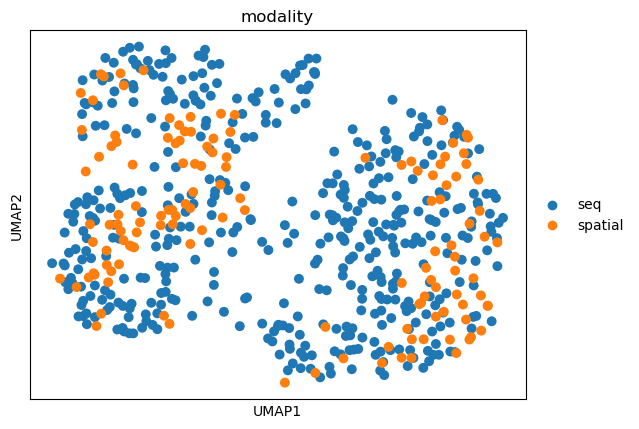

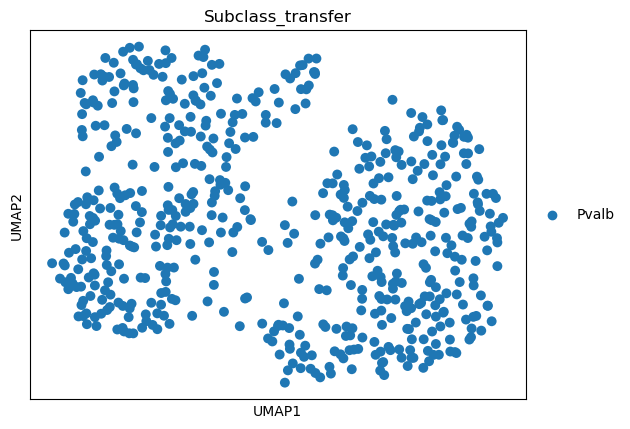

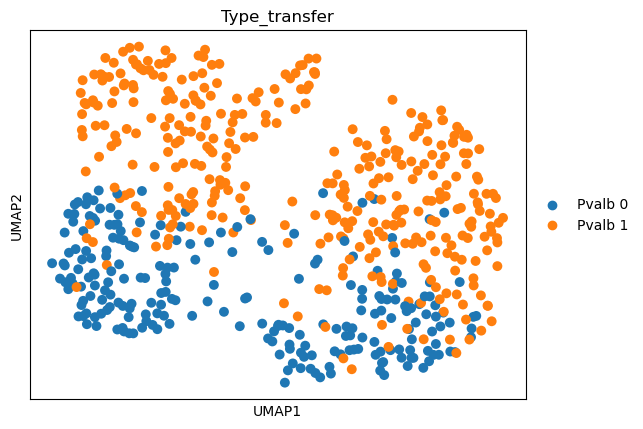

Integrating for partition p195


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=91
Score Anchors
Identified 4650 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 93 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


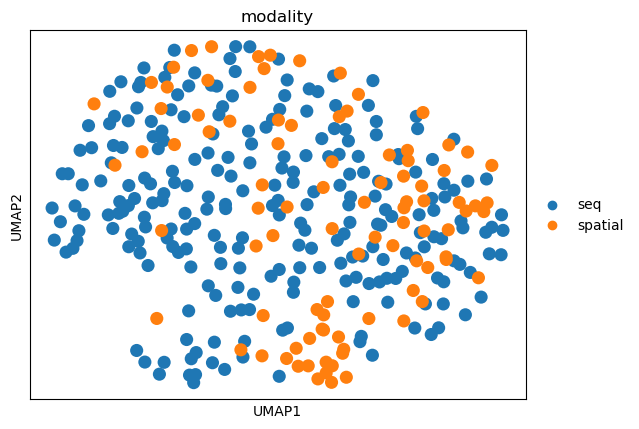

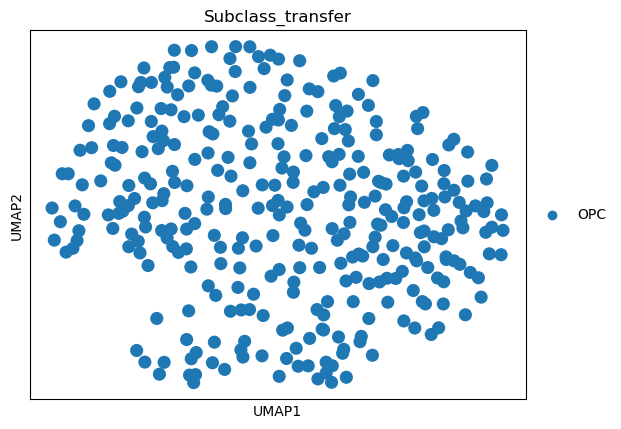

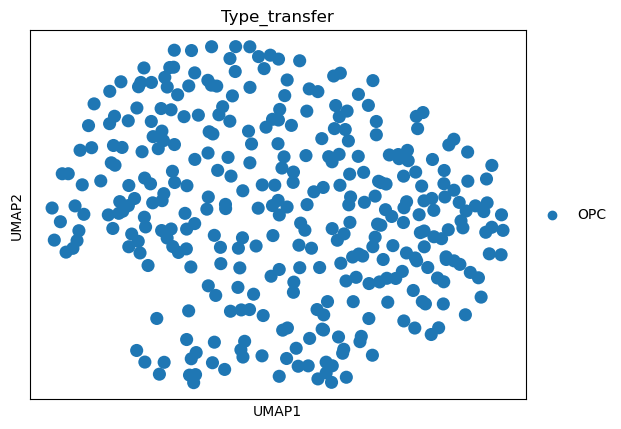

Integrating for partition p196


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 5499 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 148 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


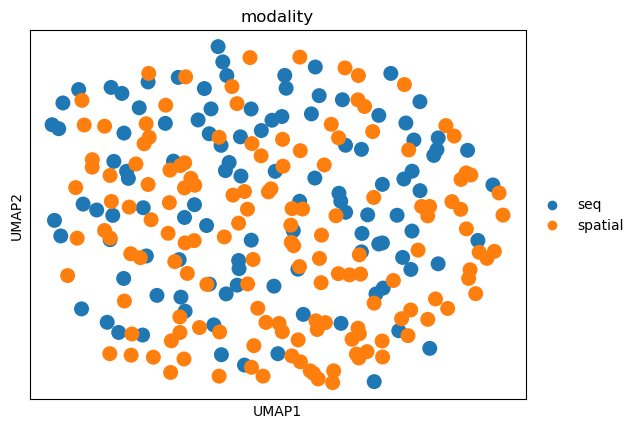

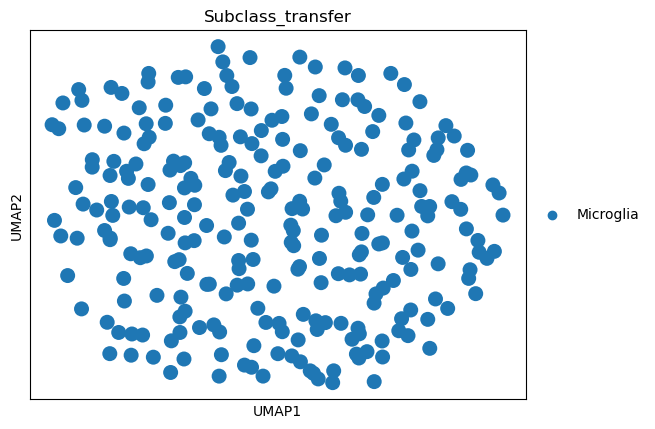

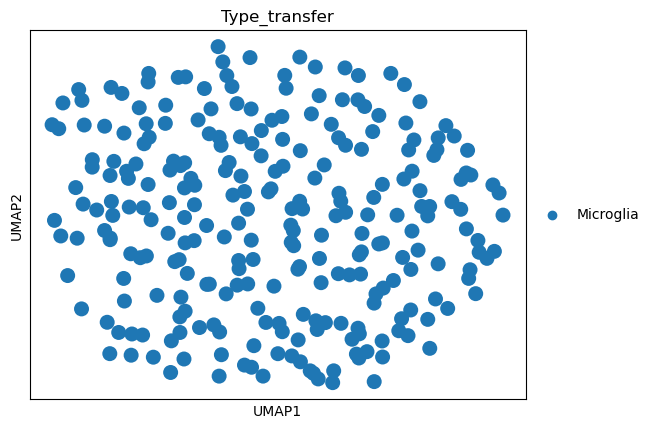

Integrating for partition p197


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=64
Score Anchors
Identified 3300 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/2 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 92 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


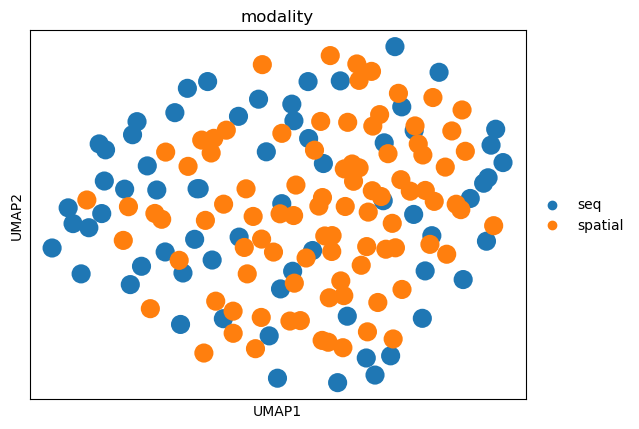

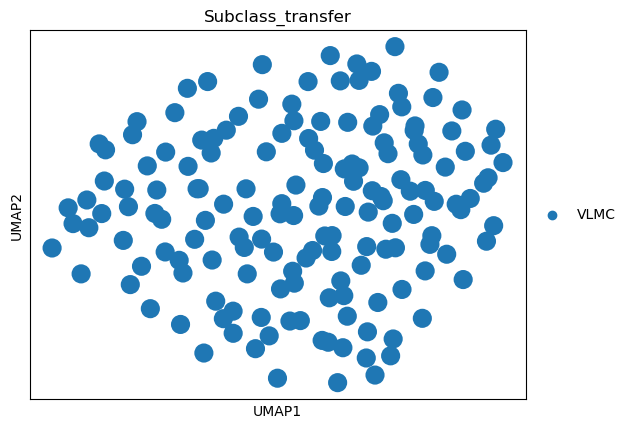

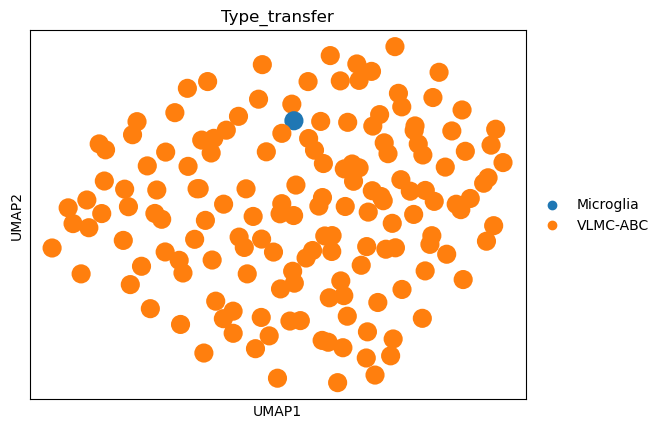

Integrating for partition p49


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 46500 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 3/3 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 930 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


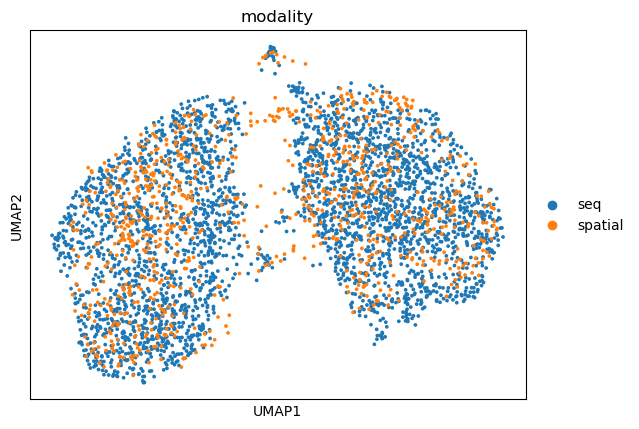

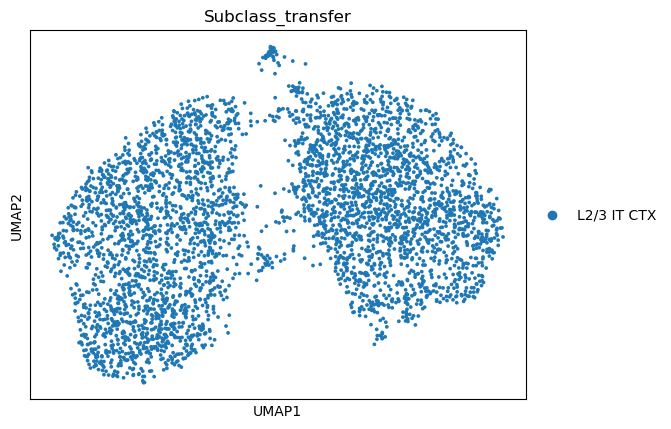

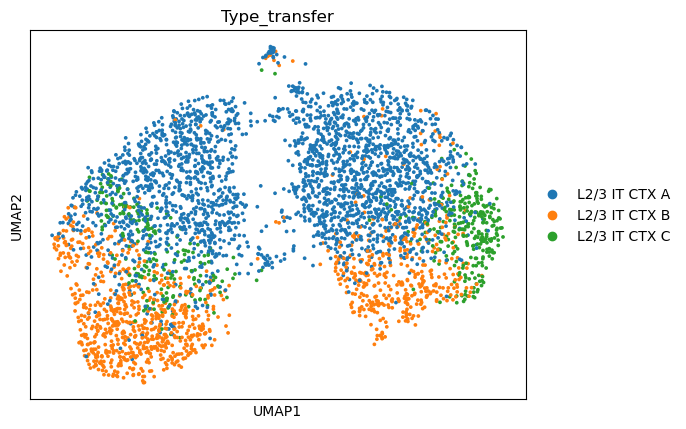

Integrating for partition p61


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 9200 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/3 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 184 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


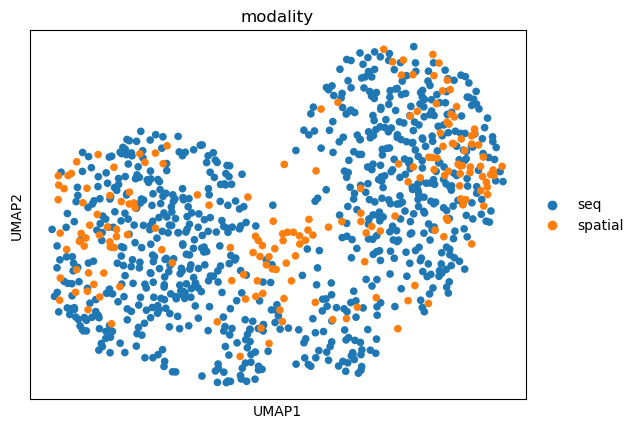

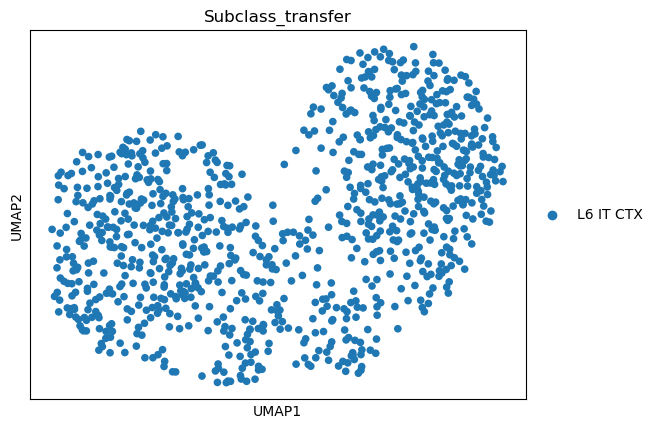

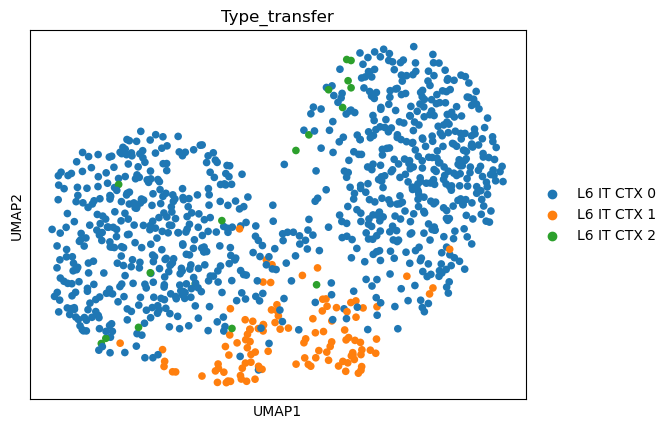

Integrating for partition p74


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 29500 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/3 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 590 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


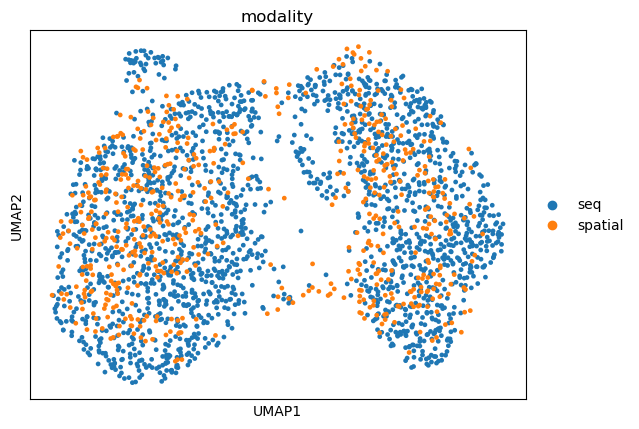

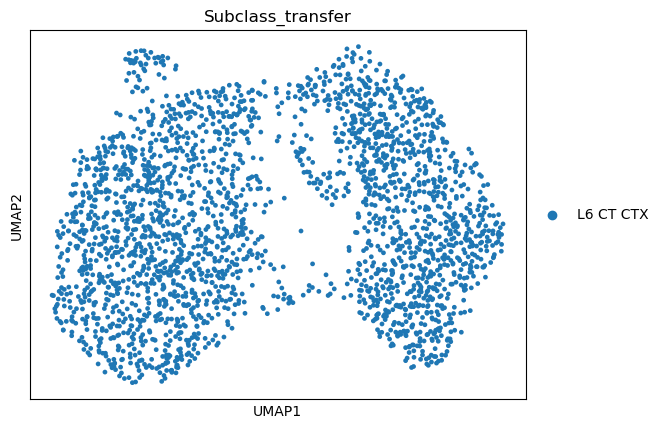

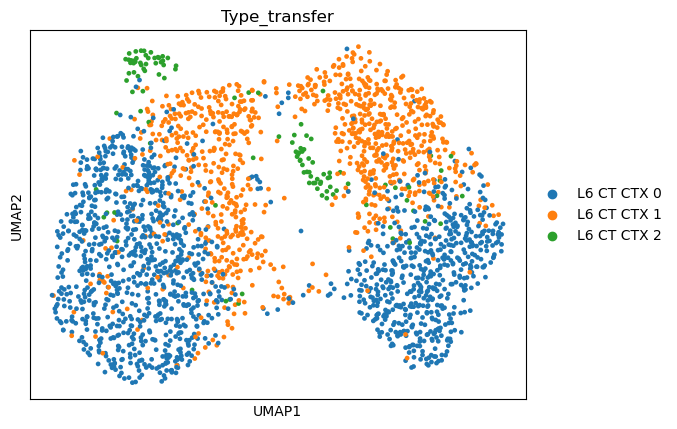

Integrating for partition p99


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 20
Find Anchors using k=100
Score Anchors
Identified 17350 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 4/4 Type.
Initialize
Find nearest anchors. k_weight:  30


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
  D = (1 - D / D[:, -1][:, None]) * score[G]
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 347 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


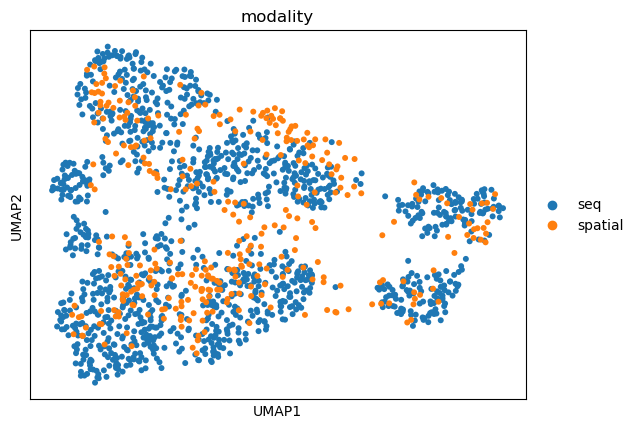

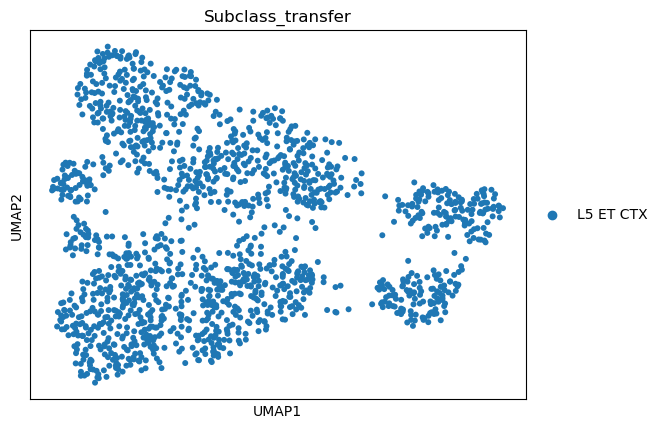

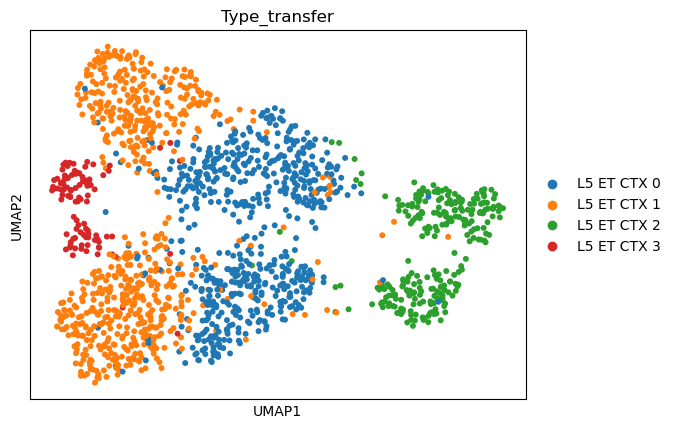

CPU times: user 1h 4min 57s, sys: 5min 46s, total: 1h 10min 44s
Wall time: 29min 55s


In [89]:

%%time
# 设置工作目录
workspace_path = '/mnt/f/spatial/V1_integration/DR1_2/'
partition_path = workspace_path + 'partitions/'
partitions = sorted(os.listdir(partition_path))

for pn in partitions:
    print(f'Integrating for partition {pn}')
    
    # 设置每个分区的文件路径
    integration_path = partition_path + pn + '/'
    input_adata_seq_file = os.path.join(integration_path, 'adata_seq.h5ad')
    input_adata_spatial_file = os.path.join(integration_path, 'adata_spatial_integrated.h5ad')
    
    # 检查文件是否存在
    if not (os.path.exists(input_adata_seq_file) and os.path.exists(input_adata_spatial_file)):
        print(f'Missing input files for partition {pn}. Skipping this integration.')
        continue  # 如果文件缺失，跳过此分区
    ## Load and preprocess the data
    adata_seq_raw = sc.read_h5ad(input_adata_seq_file)
    adata_seq = adata_seq_raw.copy()
    adata_spatial_raw = sc.read_h5ad(input_adata_spatial_file)
    adata_spatial = adata_spatial_raw.copy()

    # Consider the common genes
    common_genes = np.array(adata_seq.var_names.intersection(adata_spatial.var_names))
    #adata_seq._inplace_subset_var(common_genes)
    
    # Normalize
    sc.pp.normalize_total(adata_seq, target_sum=1000)
    sc.pp.log1p(adata_seq)
    sc.pp.normalize_total(adata_spatial, target_sum=1000)
    sc.pp.log1p(adata_spatial)
    
    # Select variable genes
    #sc.pp.highly_variable_genes(adata_seq)
    #hv_genes = list(adata_seq.var.index[adata_seq.var['dispersions'] > 0])
    #adata_seq = adata_seq[:, adata_seq.var.index.isin(hv_genes)]
    #adata_spatial = adata_spatial[:, adata_spatial.var.index.isin(hv_genes)]
    #print(f'Use {len(hv_genes)} highly variable genes for integration.')
    
    # Scale the data
    sc.pp.scale(adata_seq)
    sc.pp.scale(adata_spatial)
    
    # Merge the datasets
    adata_merge = adata_seq.concatenate(adata_spatial,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None)
     # Select variable genes
    #sc.pp.highly_variable_genes(adata_merge)
    #target_genes=['Syt17','Stard8','Whrn','Rorb','Scnn1a','Syt2','Tle4','Syt6','Ccn2']
    #adata_merge.var['highly_variable'] = (
    #adata_merge.var['highly_variable'] | adata_merge.var_names.isin(target_genes))
    # PCA

    n_pcs = 20
    sc.tl.pca(adata_merge, svd_solver='arpack', n_comps=n_pcs)
    
    adata_list = [adata_merge[adata_merge.obs['modality'] == 'seq'],
                  adata_merge[adata_merge.obs['modality'] == 'spatial']]
    
    ## Integration
    # Find the integration anchors
    integrator = SeuratIntegration()
    integrator.find_anchor(adata_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=50,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None, #why?
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])
    
    # Label transfer
    cell_type_cols = ['Subclass', 'Type']
    transfer_results = integrator.label_transfer(
        ref=[0],
        qry=[1],
        categorical_key=cell_type_cols,
        key_dist='X_pca',
        k_weight=100,
        npc=n_pcs
    )
    integrator.save_transfer_results_to_adata(adata_merge, transfer_results)
    
    # Assign the transfered labels and the confidence
    for cell_type_col in cell_type_cols:
        adata_spatial_raw.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1
                                                                                           ).astype('category')
        adata_spatial_raw.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)
        
        n_transfered = len(np.unique(adata_spatial_raw.obs[cell_type_col + '_transfer']))
        n_total = len(np.unique(adata_merge.obs[cell_type_col + '_transfer']))
        print(f'Transfered {n_transfered}/{n_total} {cell_type_col}.')
    
    # Impute gene expression
    X_imputed = impute_gene_expression(integrator, adata_list, adata_seq_raw.X, 
                                       ref=0, qry=1, npc=n_pcs, chunk_size=5000)
    adata_imputed = anndata.AnnData(X=X_imputed, obs=adata_spatial_raw.obs.copy(), 
                                var=adata_seq_raw.var.copy(), dtype=np.float32)
    print(adata_imputed)

    # 创建一个具有与 `adata_spatial_raw` 相同维度的矩阵，初始值为 0
    imputed_data = np.zeros(adata_spatial_raw.shape)

    # 匹配并填充 `imputed_data` 中的基因表达数据
    for i, gene in enumerate(adata_imputed.var_names):
        if gene in adata_spatial_raw.var_names:
           idx = adata_spatial_raw.var_names.get_loc(gene)
           imputed_data[:, idx] = adata_imputed[:, i].X.toarray().flatten()

    # 将填充后的矩阵存储在 `layers` 中
    adata_spatial_raw.layers['imputed'] = imputed_data
    # Save the label transfer results
    adata_spatial_raw.write_h5ad(os.path.join(integration_path, 'adata_spatial_label_transfer.h5ad'), 
                                 compression='gzip')
    # Create the imputation gene partition table
    gene_partition_df = adata_seq_raw.var.copy()
    gene_partition_df.index.name = 'gene'
    gene_partition_df['gene_partition'] = np.arange(gene_partition_df.shape[0], dtype=int) // 1000
    gene_partition_df.to_csv(os.path.join(integration_path,f'/mnt/f/spatial/V1_integration/DR1_2/partitions/{pn}/gene_partition.csv'))
    
    gene_partitions = np.unique(gene_partition_df['gene_partition'])

    
    ## Co-embedding
    # Correct the PCs using the integration anchors
    corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=n_pcs,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

    adata_merge.obsm['X_pca_integrate'] = np.concatenate(corrected)
    
    # Calculate KNN using the integrated PCs
    sc.pp.neighbors(adata_merge, use_rep='X_pca_integrate')
    
    if len(np.unique(adata_merge.obs['Subclass_transfer'])) > 1:
        # Generate the PAGA plot for the initial arrangement of the UMAP
        sc.tl.paga(adata_merge, groups='Subclass_transfer')
        sc.pl.paga(adata_merge, save=f'{pn}_paga.png', cmap='gist_ncar')
    
        sc.tl.umap(adata_merge, init_pos='paga', min_dist=0.5)
    else:
        sc.tl.umap(adata_merge, min_dist=0.5)
        
    # Save the umap
    sc.pl.umap(adata_merge, color='modality', save=f'{pn}_umap_modality.png')
    sc.pl.umap(adata_merge, color='Subclass_transfer', save=f'{pn}_umap_subclass.png' )
    sc.pl.umap(adata_merge, color='Type_transfer', save=f'{pn}_umap_type.png')

    # 保存合并后的数据
    adata_merge.write_h5ad(os.path.join(integration_path, 'adata_merged_round2.h5ad'), compression='gzip')

Integrating for partition p55


<timed exec>:45: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


Find anchors across datasets.
Run CCA
non zero dims 3
Find Anchors using k=2


/root/anaconda3/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Score Anchors
Identified 8 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  5


/root/anaconda3/lib/python3.10/site-packages/pynndescent/pynndescent_.py:939: UserWarning: Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.
  warn(


Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  5


/root/anaconda3/lib/python3.10/site-packages/pynndescent/pynndescent_.py:939: UserWarning: Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.
  warn(


Normalize graph
AnnData object with n_obs × n_vars = 4 × 21987
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_D1', 'highly_variable-V1_D1', 'means-V1_D1', 'dispersions-V1_D1', 'dispersions_norm-V1_D1', 'n_cells-V1_D2', 'highly_variable-V1_D2', 'means-V1_D2', 'dispersions-V1_D2', 'dispersions_norm-V1_D2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  5


/root/anaconda3/lib/python3.10/site-packages/pynndescent/pynndescent_.py:939: UserWarning: Failed to correctly find n_neighbors for some samples. Results may be less than ideal. Try re-running with different parameters.
  warn(


Normalize graph
Transform data


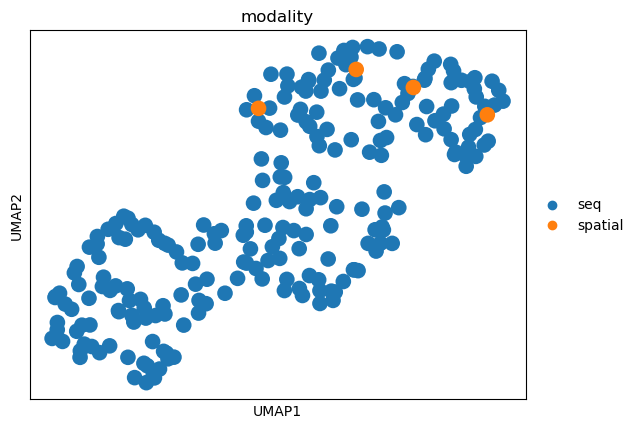

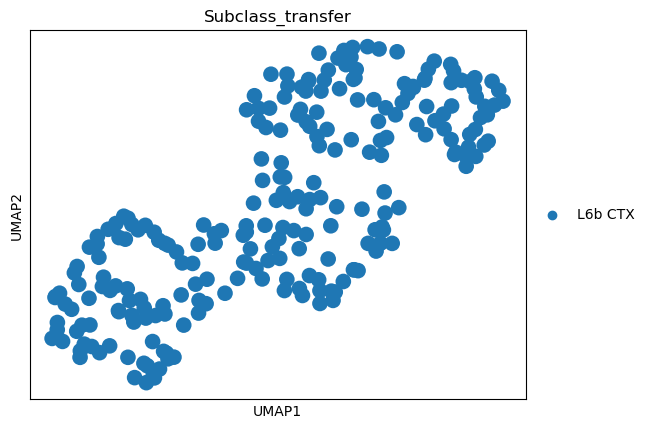

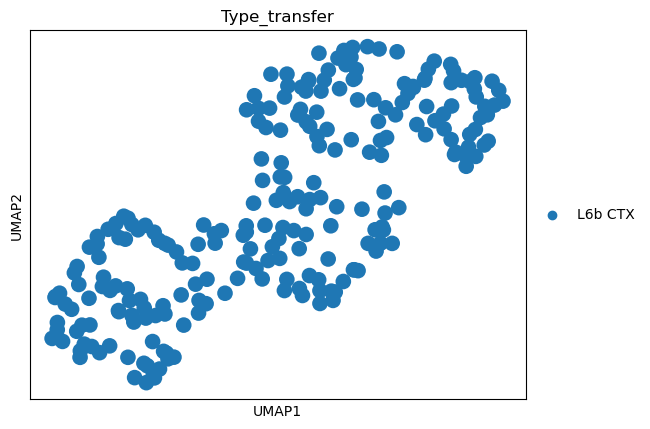

CPU times: user 51.6 s, sys: 194 ms, total: 51.8 s
Wall time: 46.8 s


In [95]:

%%time
# 设置工作目录
workspace_path = '/mnt/f/spatial/V1_integration/DR1_2/'
partition_path = workspace_path + 'partitions/'
partitions = ['p55']
for pn in partitions:
    print(f'Integrating for partition {pn}')
    
    # 设置每个分区的文件路径
    integration_path = partition_path + pn + '/'
    input_adata_seq_file = os.path.join(integration_path, 'adata_seq.h5ad')
    input_adata_spatial_file = os.path.join(integration_path, 'adata_spatial_integrated.h5ad')
    
    # 检查文件是否存在
    if not (os.path.exists(input_adata_seq_file) and os.path.exists(input_adata_spatial_file)):
        print(f'Missing input files for partition {pn}. Skipping this integration.')
        continue  # 如果文件缺失，跳过此分区
    ## Load and preprocess the data
    adata_seq_raw = sc.read_h5ad(input_adata_seq_file)
    adata_seq = adata_seq_raw.copy()
    adata_spatial_raw = sc.read_h5ad(input_adata_spatial_file)
    adata_spatial = adata_spatial_raw.copy()

    # Consider the common genes
    common_genes = np.array(adata_seq.var_names.intersection(adata_spatial.var_names))
    #adata_seq._inplace_subset_var(common_genes)
    
    # Normalize
    sc.pp.normalize_total(adata_seq, target_sum=1000)
    sc.pp.log1p(adata_seq)
    sc.pp.normalize_total(adata_spatial, target_sum=1000)
    sc.pp.log1p(adata_spatial)
    
    # Select variable genes
    #sc.pp.highly_variable_genes(adata_seq)
    #hv_genes = list(adata_seq.var.index[adata_seq.var['dispersions'] > 0])
    #adata_seq = adata_seq[:, adata_seq.var.index.isin(hv_genes)]
    #adata_spatial = adata_spatial[:, adata_spatial.var.index.isin(hv_genes)]
    #print(f'Use {len(hv_genes)} highly variable genes for integration.')
    
    # Scale the data
    sc.pp.scale(adata_seq)
    sc.pp.scale(adata_spatial)
    
    # Merge the datasets
    adata_merge = adata_seq.concatenate(adata_spatial,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None)
     # Select variable genes
    #sc.pp.highly_variable_genes(adata_merge)
    #target_genes=['Syt17','Stard8','Whrn','Rorb','Scnn1a','Syt2','Tle4','Syt6','Ccn2']
    #adata_merge.var['highly_variable'] = (
    #adata_merge.var['highly_variable'] | adata_merge.var_names.isin(target_genes))
    # PCA

    n_pcs = 3
    sc.tl.pca(adata_merge, svd_solver='arpack', n_comps=n_pcs)
    
    adata_list = [adata_merge[adata_merge.obs['modality'] == 'seq'],
                  adata_merge[adata_merge.obs['modality'] == 'spatial']]
    
    ## Integration
    # Find the integration anchors
    integrator = SeuratIntegration()
    integrator.find_anchor(adata_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=2,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None, #why?
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])
    
    # Label transfer
    cell_type_cols = ['Subclass', 'Type']
    transfer_results = integrator.label_transfer(
        ref=[0],
        qry=[1],
        categorical_key=cell_type_cols,
        key_dist='X_pca',
        k_weight=100,
        npc=n_pcs
    )
    integrator.save_transfer_results_to_adata(adata_merge, transfer_results)
    
    # Assign the transfered labels and the confidence
    for cell_type_col in cell_type_cols:
        adata_spatial_raw.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1
                                                                                           ).astype('category')
        adata_spatial_raw.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)
        
        n_transfered = len(np.unique(adata_spatial_raw.obs[cell_type_col + '_transfer']))
        n_total = len(np.unique(adata_merge.obs[cell_type_col + '_transfer']))
        print(f'Transfered {n_transfered}/{n_total} {cell_type_col}.')
    
    # Impute gene expression
    X_imputed = impute_gene_expression(integrator, adata_list, adata_seq_raw.X, 
                                       ref=0, qry=1, npc=n_pcs, chunk_size=5000)
    adata_imputed = anndata.AnnData(X=X_imputed, obs=adata_spatial_raw.obs.copy(), 
                                var=adata_seq_raw.var.copy(), dtype=np.float32)
    print(adata_imputed)

    # 创建一个具有与 `adata_spatial_raw` 相同维度的矩阵，初始值为 0
    imputed_data = np.zeros(adata_spatial_raw.shape)

    # 匹配并填充 `imputed_data` 中的基因表达数据
    for i, gene in enumerate(adata_imputed.var_names):
        if gene in adata_spatial_raw.var_names:
           idx = adata_spatial_raw.var_names.get_loc(gene)
           imputed_data[:, idx] = adata_imputed[:, i].X.toarray().flatten()

    # 将填充后的矩阵存储在 `layers` 中
    adata_spatial_raw.layers['imputed'] = imputed_data
    # Save the label transfer results
    adata_spatial_raw.write_h5ad(os.path.join(integration_path, 'adata_spatial_label_transfer.h5ad'), 
                                 compression='gzip')
    # Create the imputation gene partition table
    gene_partition_df = adata_seq_raw.var.copy()
    gene_partition_df.index.name = 'gene'
    gene_partition_df['gene_partition'] = np.arange(gene_partition_df.shape[0], dtype=int) // 1000
    gene_partition_df.to_csv(os.path.join(integration_path,f'/mnt/f/spatial/V1_integration/DR1_2/partitions/{pn}/gene_partition.csv'))
    
    gene_partitions = np.unique(gene_partition_df['gene_partition'])

    
    ## Co-embedding
    # Correct the PCs using the integration anchors
    corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=n_pcs,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

    adata_merge.obsm['X_pca_integrate'] = np.concatenate(corrected)
    
    # Calculate KNN using the integrated PCs
    sc.pp.neighbors(adata_merge, use_rep='X_pca_integrate')
    
    if len(np.unique(adata_merge.obs['Subclass_transfer'])) > 1:
        # Generate the PAGA plot for the initial arrangement of the UMAP
        sc.tl.paga(adata_merge, groups='Subclass_transfer')
        sc.pl.paga(adata_merge, save=f'{pn}_paga.png', cmap='gist_ncar')
    
        sc.tl.umap(adata_merge, init_pos='paga', min_dist=0.5)
    else:
        sc.tl.umap(adata_merge, min_dist=0.5)
        
    # Save the umap
    sc.pl.umap(adata_merge, color='modality', save=f'{pn}_umap_modality.png')
    sc.pl.umap(adata_merge, color='Subclass_transfer', save=f'{pn}_umap_subclass.png' )
    sc.pl.umap(adata_merge, color='Type_transfer', save=f'{pn}_umap_type.png')

    # 保存合并后的数据
    adata_merge.write_h5ad(os.path.join(integration_path, 'adata_merged_round2.h5ad'), compression='gzip')

In [96]:
import scipy.sparse
import scipy.spatial

def get_cluster_mean_expression_matrix(adata, cluster_column):
    '''Get a dataframe of mean gene expression of each cluster.'''
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
   
    cell_exp_mtx = pd.DataFrame(X, index=adata.obs[cluster_column], columns=adata.var.index)    
    return cell_exp_mtx.groupby(by=cluster_column).mean()


def calc_cell_cosines_to_cluster_mean_exps(adata, cluster_col, cluster_mean_exp_df):
    cluster_mean_exp_df = cluster_mean_exp_df.loc[:, adata.var.index]
    cluster_id_map = {cluster_mean_exp_df.index[i]:i for i in range(cluster_mean_exp_df.shape[0])}
    cell_cluster_ids = np.array(adata.obs[cluster_col].map(cluster_id_map))
    
    X_cluster_mean = cluster_mean_exp_df.values[cell_cluster_ids]
    
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
    
    cosines = []
    for i in range(adata.shape[0]):
        if np.sum(X[i]) > 0:
            cosines.append(1 - scipy.spatial.distance.cosine(X[i], X_cluster_mean[i]))
        else:
            cosines.append(0)
    
    return cosines

In [97]:
# Combine the label transfer results

partition_path = '/mnt/f/spatial/V1_integration/DR1_2/partitions'
partitions = sorted(os.listdir(partition_path))
adatas = []
for pn in partitions:
    adata_file = os.path.join(partition_path, pn, 'adata_spatial_label_transfer.h5ad')
    adatas.append(sc.read_h5ad(adata_file))
    
adata = anndata.concat(adatas)
adata.write_h5ad('/mnt/f/spatial/V1_integration/DR1_2/spatial_tranfer_12.h5ad')

In [98]:
# Combine the merged data
partition_path = '/mnt/f/spatial/V1_integration/DR1_2/partitions'
partitions = sorted(os.listdir(partition_path))
adatas = []
for pn in partitions:
    adata_file = os.path.join(partition_path, pn, 'adata_merged_round2.h5ad')
    adatas.append(sc.read_h5ad(adata_file))
    
adata_merged2 = anndata.concat(adatas)
adata_merged2.write_h5ad('/mnt/f/spatial/V1_integration/DR1_2/spatial_merged_round2_12.h5ad')

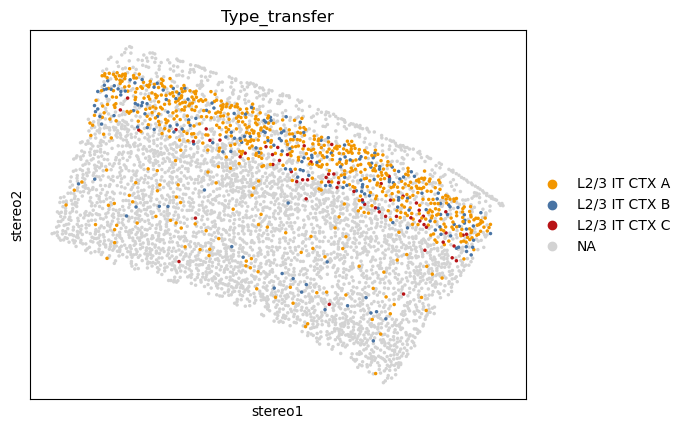

In [99]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX A','L2/3 IT CTX B','L2/3 IT CTX C'],palette=["#b81316","#f29600","#4974a4"])

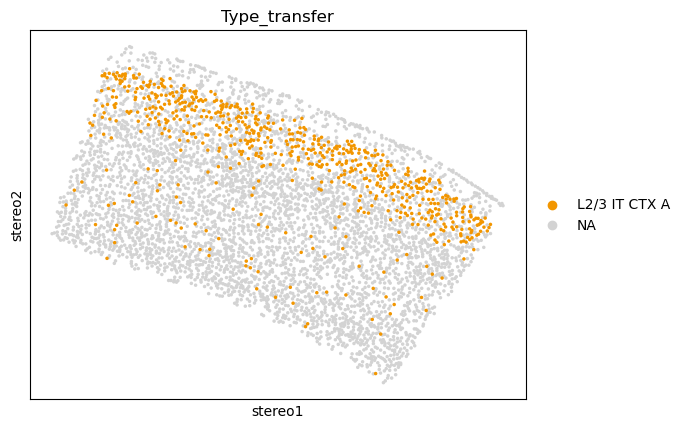

In [100]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX A'])

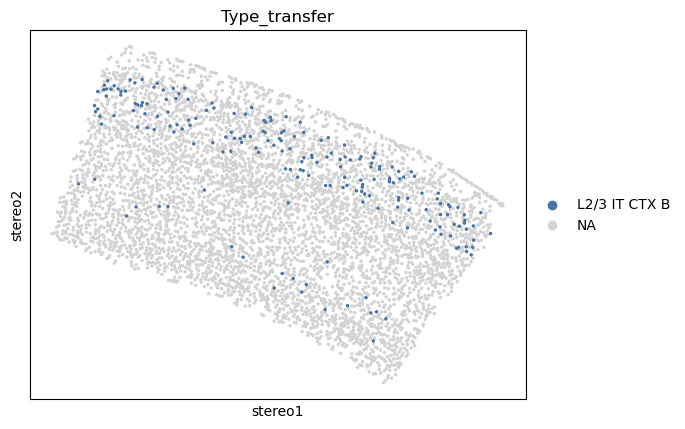

In [101]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX B'])

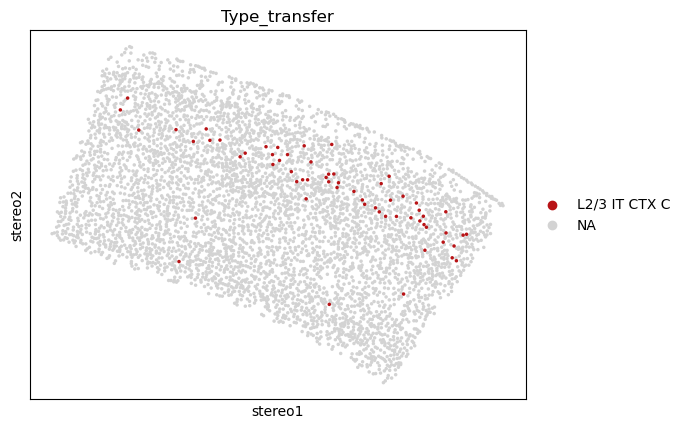

In [102]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX C'])

In [3]:
adata=sc.read_h5ad('F:/spatial/V1_integration/DR1_2/spatial_tranfer_12.h5ad')

In [4]:
all_spatial = pd.read_csv('F:/spatial/V1_integration/cortex/DR1_2_cortex.csv',index_col='cell_id')

In [5]:
all_spatial_index = all_spatial.index.astype(str)

In [6]:
adata_index =adata.obs.index.astype(str)

In [7]:
common_index  =all_spatial_index.intersection(adata_index)

In [8]:
common_index

Index(['12433', '12434', '12435', '12436', '12437', '12438', '12439', '12440',
       '12441', '12442',
       ...
       '37513', '37514', '37515', '37517', '37518', '37519', '37520', '37521',
       '37522', '37526'],
      dtype='object', length=4734)

In [12]:
all_spatial.index = all_spatial.index.astype(str)

In [13]:
spatial_common = all_spatial.loc[all_spatial.index.intersection(common_index)]

In [14]:
adata.obs['digital_layer']=spatial_common['digital_layer']

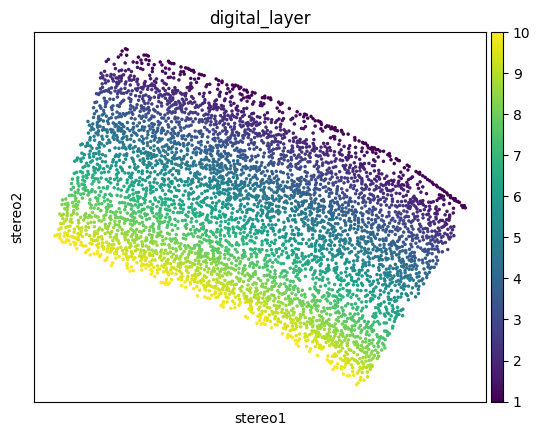

In [15]:
sc.pl.embedding(adata, basis='stereo',color='digital_layer')

In [16]:
adata.write_h5ad('F:/spatial/V1_integration/DR1_2/spatial_tranfer_digital_layer_12.h5ad')

In [139]:
adata_it =adata[adata.obs['Subclass_transfer']!='Astro'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Microglia'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='OPC'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Oligo'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Pvalb'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Sst'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Vip'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='ABC'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='VLMC'] 

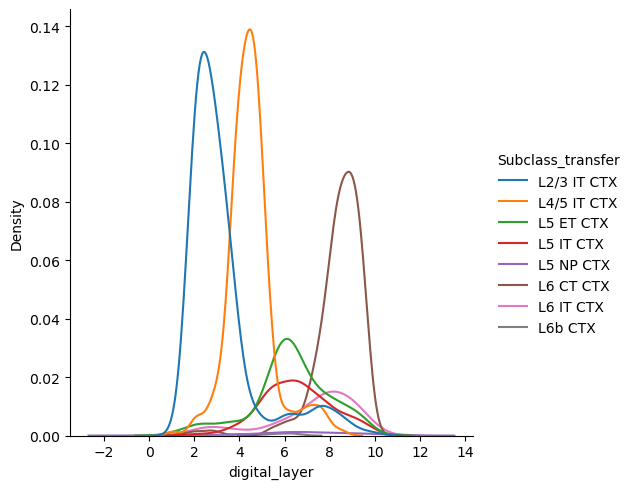

In [140]:
sns.displot(data=adata_it.obs, x='digital_layer',hue="Subclass_transfer",kind='kde')

In [117]:
adata_l23 = adata[adata.obs['Subclass_transfer']=='L2/3 IT CTX']

/root/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


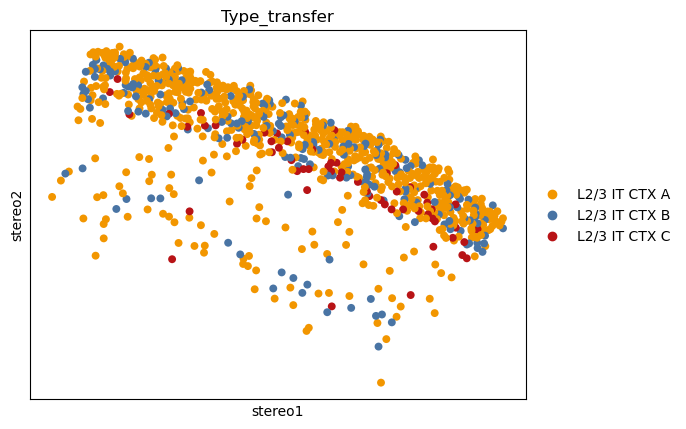

In [118]:
sc.pl.embedding(adata_l23,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX A','L2/3 IT CTX B','L2/3 IT CTX C'],palette=["#f29600","#4974a4","#b81316"])

(0.0, 5.5)

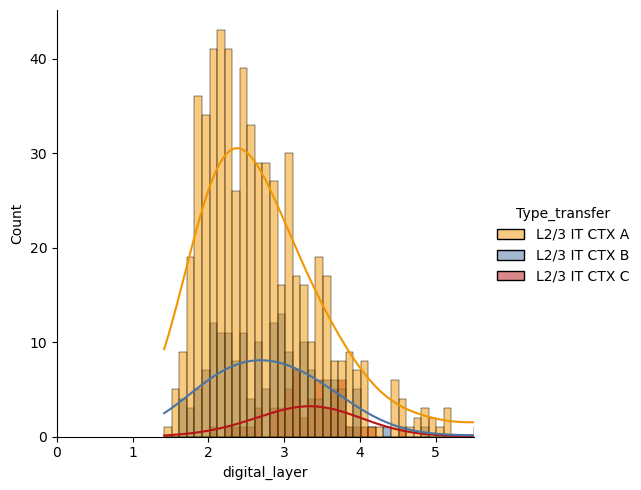

In [159]:
sns.displot(data=adata_l23.obs, x="digital_layer",hue="Type_transfer",kde=True,palette=["#f29600","#4974a4","#b81316"],binwidth=0.1)
plt.xlim(0,5.5)

(0.0, 5.5)

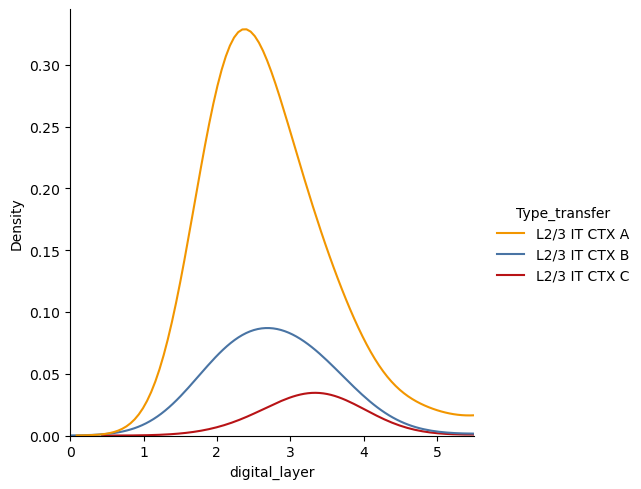

In [119]:
sns.displot(data=adata_l23.obs, x="digital_layer",hue="Type_transfer",kind='hist',element='step',palette=["#f29600","#4974a4","#b81316"])
plt.xlim(0,5.5)

/tmp/ipykernel_263086/501535092.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax= sns.barplot(data=type_proportions, x='Type_transfer', y='Proportion', palette=["#f29600","#4974a4","#b81316"])


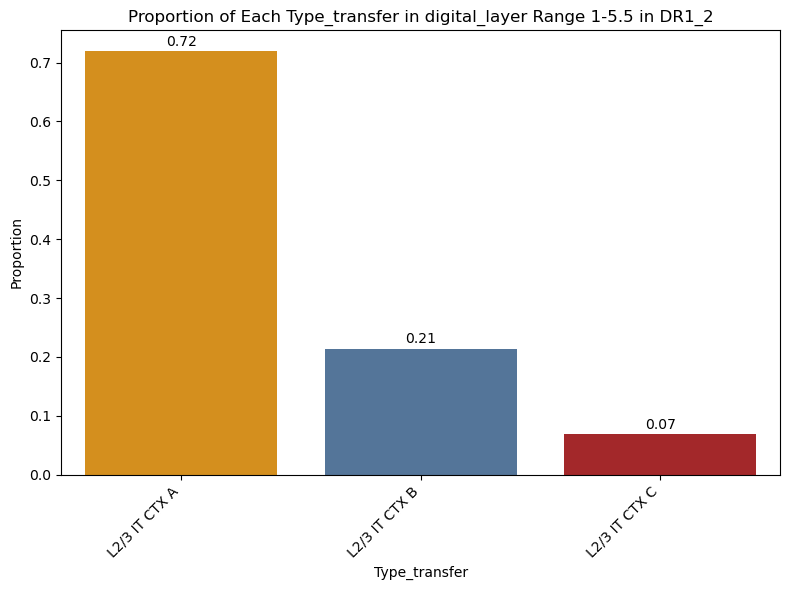

In [152]:
# 筛选出 digital_layer 在 1 到 1.5 范围内的数据
filtered_data = adata_l23.obs[(adata_l23.obs['digital_layer'] >= 1) & (adata_l23.obs['digital_layer'] <= 5.5)]

# 计算每个 Type_transfer 的频数
type_counts = filtered_data['Type_transfer'].value_counts()

# 计算每个 Type_transfer 在筛选范围内的比例
type_proportions = (type_counts / len(filtered_data)).reset_index()
type_proportions.columns = ['Type_transfer', 'Proportion']

# 绘制柱状图
plt.figure(figsize=(8, 6))
ax= sns.barplot(data=type_proportions, x='Type_transfer', y='Proportion', palette=["#f29600","#4974a4","#b81316"])
plt.title("Proportion of Each Type_transfer in digital_layer Range 1-5.5 in DR1_2")
plt.xlabel("Type_transfer")
plt.ylabel("Proportion")
plt.xticks(rotation=45, ha='right')
# 在每个柱子上显示比例数值
for index, row in type_proportions.iterrows():
    ax.text(index, row['Proportion'] + 0.01, f"{row['Proportion']:.2f}", color='black', ha="center")
plt.tight_layout()
plt.show()



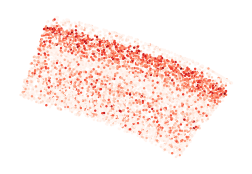

In [121]:
# 确定目标基因
target_gene = 'Syt17'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

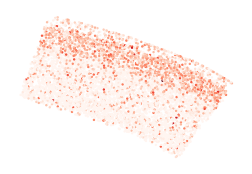

In [122]:
# 确定目标基因
target_gene = 'Stard8'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

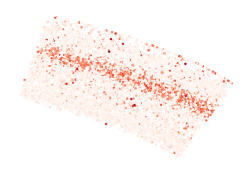

In [123]:
# 确定目标基因
target_gene = 'Whrn'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

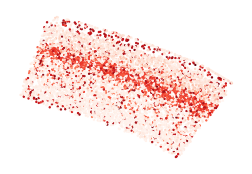

In [124]:
# 确定目标基因
target_gene = 'Rorb'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

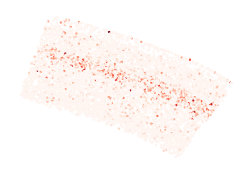

In [125]:
# 确定目标基因
target_gene = 'Scnn1a'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

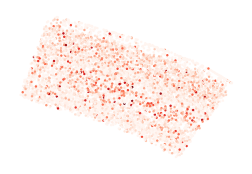

In [126]:
# 确定目标基因
target_gene = 'Syt2'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

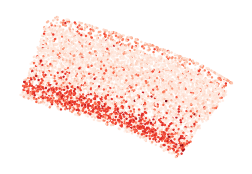

In [127]:
# 确定目标基因
target_gene = 'Tle4'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

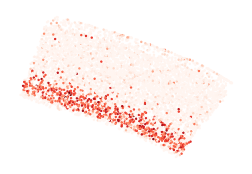

In [128]:
# 确定目标基因
target_gene = 'Syt6'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

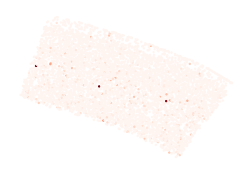

In [138]:
# 确定目标基因
target_gene = 'Cplx3'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

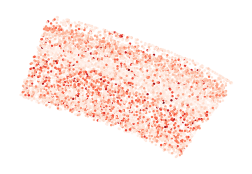

In [141]:
# 确定目标基因
target_gene = 'Cdh13'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(3, 2))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

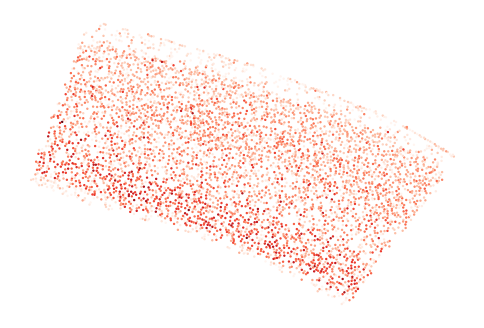

In [161]:
# 确定目标基因
target_gene = 'Igsf9b'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(6, 4))
    plt.scatter(x, y, c=gene_expression_normalized, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

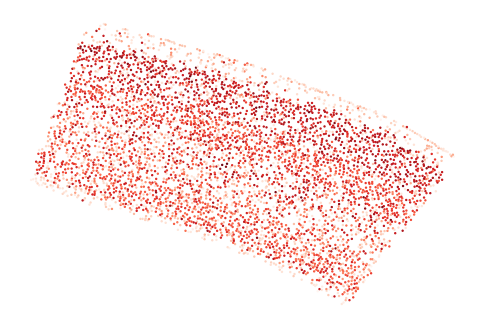

In [163]:
# 确定目标基因
target_gene = 'Egfem1'  # 替换为感兴趣的基因

# 确保目标基因存在于数据中
if target_gene in adata.var_names:
    # 获取坐标信息
    x = adata.obs['coor_x_ad']
    y = adata.obs['coor_y_ad']

    # 获取并标准化该基因的表达数据（Z-score）
    gene_expression = adata[:, target_gene].layers['imputed'].toarray().flatten()
    gene_expression_zscore = zscore(gene_expression)
    # 使用 Min-Max 归一化将 Z-score 数据缩放到 0 到 1 之间
    gene_expression_normalized = (gene_expression_zscore - gene_expression_zscore.min()) / (gene_expression_zscore.max() - gene_expression_zscore.min())
    # 创建散点图
    plt.figure(figsize=(6, 4))
    plt.scatter(x, y, c=gene_expression, cmap='Reds', s=0.5)
    #plt.colorbar(label= 'Expression (Z-score)')
    # 去掉坐标轴
    plt.axis('off')
    plt.show()
else:
    print(f"{target_gene} 不存在于数据中，请检查基因名称。")

In [ ]:
Partition, N_cells, subclasses
p124, 2978, ['L4/5 IT CTX']
p149, 679, ['L5 IT CTX']
p155, 524, ['Sst']
p161, 376, ['Vip']
p174, 837, ['Oligo']
p177, 67, ['ABC']
p180, 203, ['L5 NP CTX']
p186, 762, ['Astro']
p192, 460, ['Pvalb']
p195, 244, ['OPC']
p196, 110, ['Microglia']
p197, 66, ['VLMC']
p199, 243, ['Lamp5']
p49, 3166, ['L2/3 IT CTX']
p55, 233, ['L6b CTX']
p61, 805, ['L6 IT CTX']
p74, 1974, ['L6 CT CTX']
p99, 1282, ['L5 ET CTX']

In [75]:
subclass_dict={'p74':'L6 CT CTX',
'p195':'OPC',
'p99' :'L5 ET CTX',
'p149' :'L5 IT CTX',
'p61' :'L6 IT CTX',
'p161' :'Vip',
'p199' :'Lamp5',
'p180' :'L5 NP CTX',
'p196' :'Microglia',
'p55' :'L6b CTX',
'p197' :'VLMC',
'p177' :'ABC',
'p155' :'Sst',
'p186' :'Astro',
'p192' :'Pvalb',
'p49'  :'L2/3 IT CTX',
'p124'  :'L4/5 IT CTX',
'p174'  :'Oligo'}

In [76]:
DR_V1_merge.obs['integration_subclass_transfer'] = DR_V1_merge.obs['integration_partition_transfer'].map(subclass_dict)
print(DR_V1_merge.obs[['integration_partition_transfer', 'integration_subclass_transfer']])

                         integration_partition_transfer  \
AAACCCAAGAAGTATC-1-V1_D1                           p124   
AAACCCAAGTCCTGCG-1-V1_D1                            p49   
AAACCCACAGTCGAGA-1-V1_D1                            p49   
AAACCCACATACGCAT-1-V1_D1                            p49   
AAACCCAGTGATGAAT-1-V1_D1                           p124   
...                                                 ...   
37519                                               p74   
37520                                              p174   
37521                                              p192   
37522                                              p174   
37526                                              p174   

                         integration_subclass_transfer  
AAACCCAAGAAGTATC-1-V1_D1                   L4/5 IT CTX  
AAACCCAAGTCCTGCG-1-V1_D1                   L2/3 IT CTX  
AAACCCACAGTCGAGA-1-V1_D1                   L2/3 IT CTX  
AAACCCACATACGCAT-1-V1_D1                   L2/3 IT CTX  
AAACCC

In [78]:
DR_V1_spatial = DR_V1_merge[DR_V1_merge.obs['modality']=='spatial']

In [25]:
DR_V1_merge

AnnData object with n_obs × n_vars = 19753 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'stereo'
    varm: 'PCs'
    layers: 'counts'

In [26]:
DR_V1_spatial

View of AnnData object with n_obs × n_vars = 4744 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'stereo'
    varm: 'PCs'
    layers: 'counts'

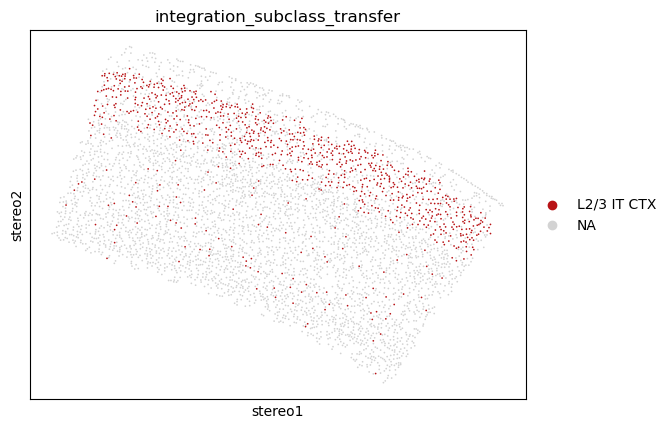

View of AnnData object with n_obs × n_vars = 930 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

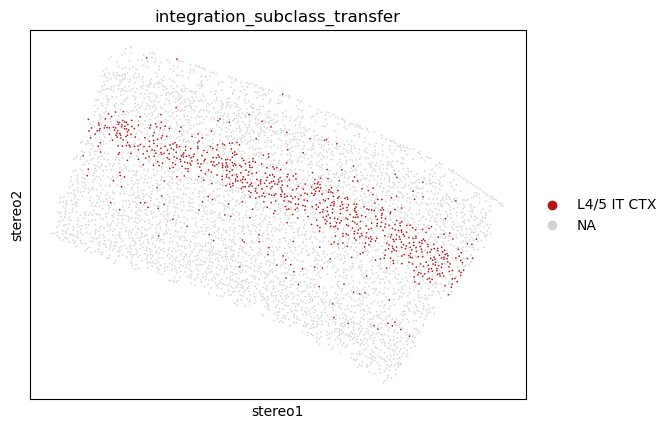

View of AnnData object with n_obs × n_vars = 831 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

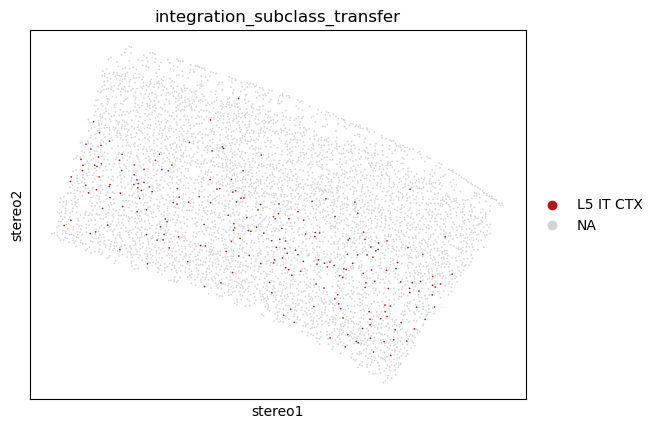

View of AnnData object with n_obs × n_vars = 232 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

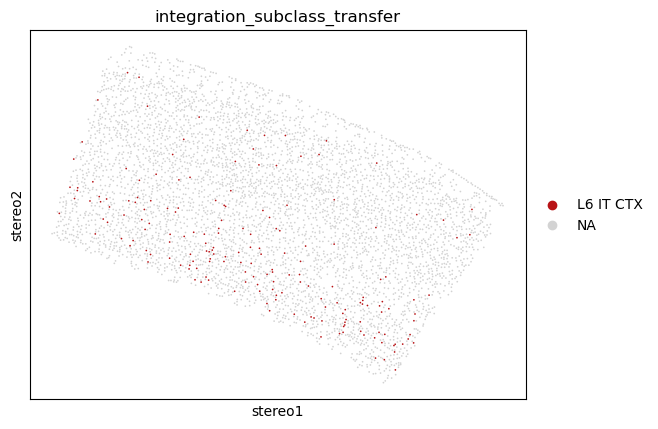

View of AnnData object with n_obs × n_vars = 184 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

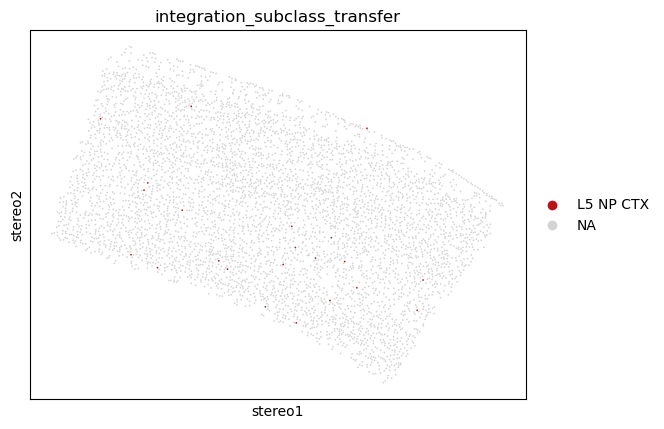

View of AnnData object with n_obs × n_vars = 22 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_u

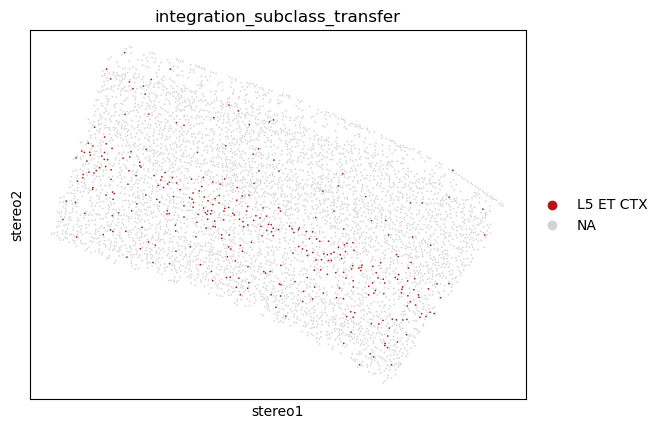

View of AnnData object with n_obs × n_vars = 347 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

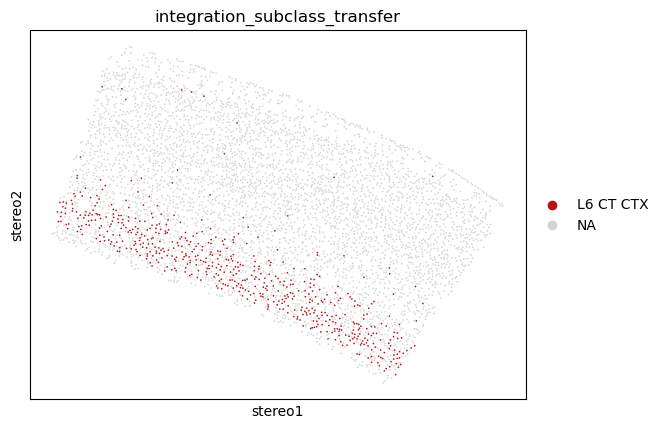

View of AnnData object with n_obs × n_vars = 590 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

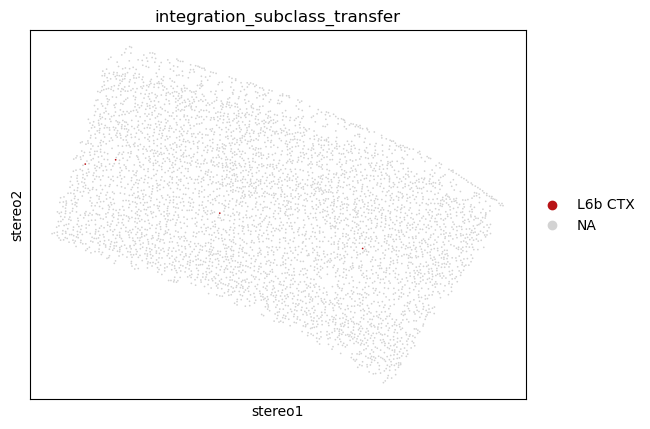

View of AnnData object with n_obs × n_vars = 4 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_um

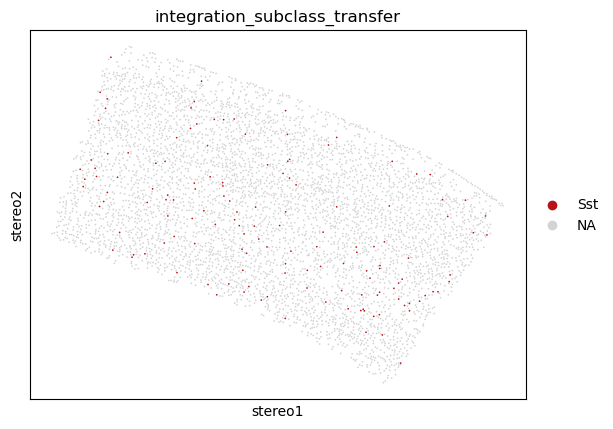

View of AnnData object with n_obs × n_vars = 142 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

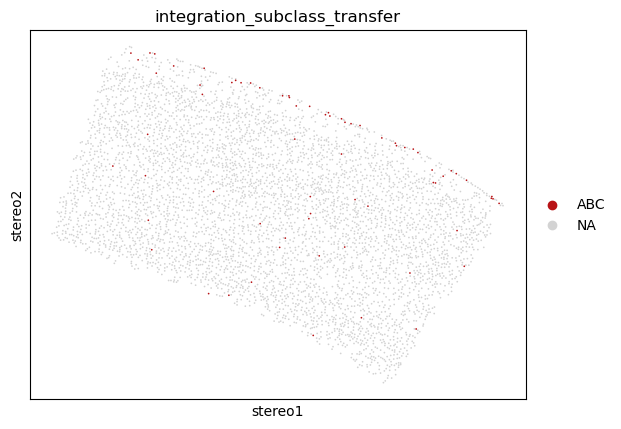

View of AnnData object with n_obs × n_vars = 70 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_u

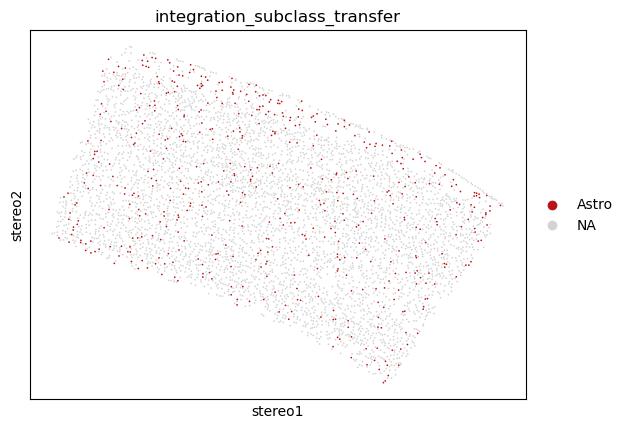

View of AnnData object with n_obs × n_vars = 531 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

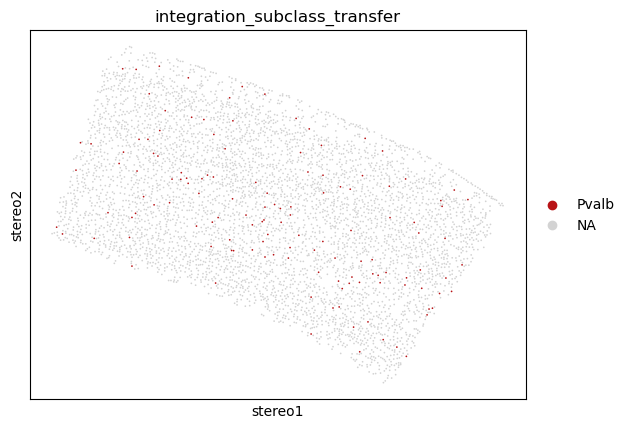

View of AnnData object with n_obs × n_vars = 133 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

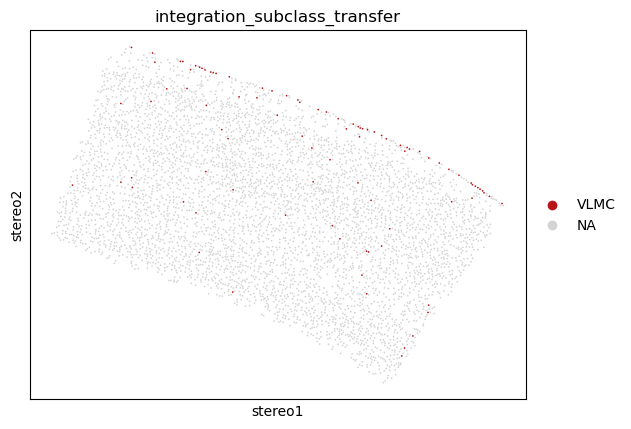

View of AnnData object with n_obs × n_vars = 92 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_u

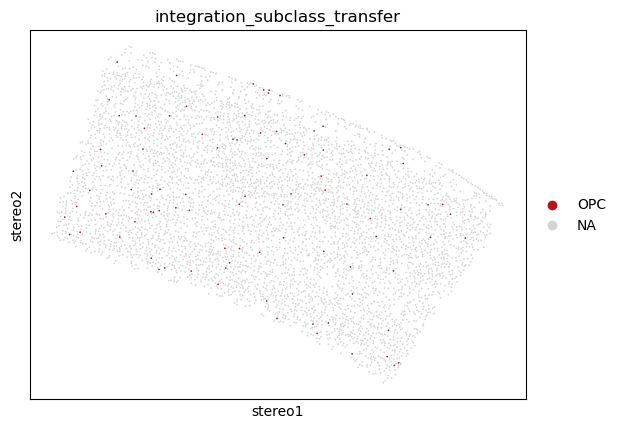

View of AnnData object with n_obs × n_vars = 93 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_u

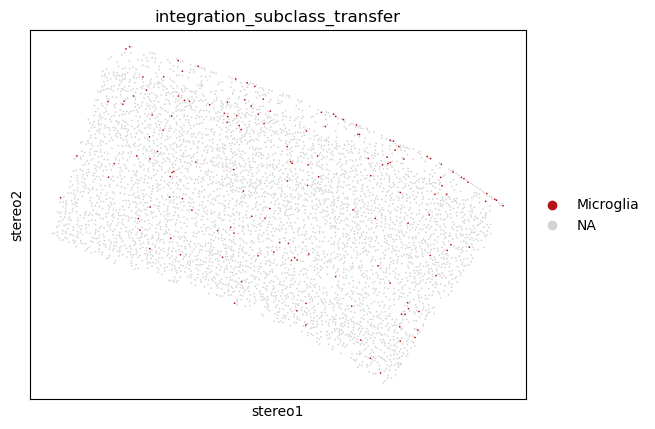

View of AnnData object with n_obs × n_vars = 148 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

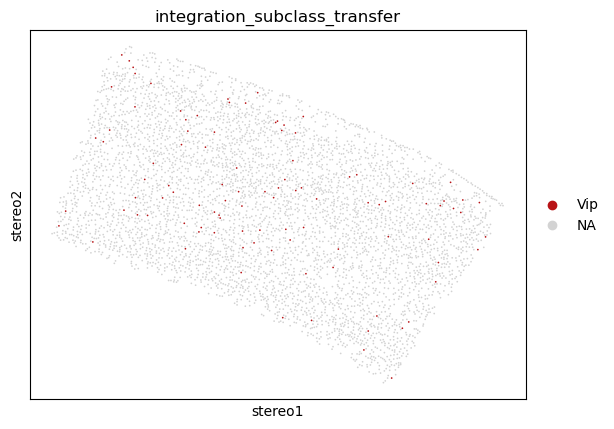

View of AnnData object with n_obs × n_vars = 101 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

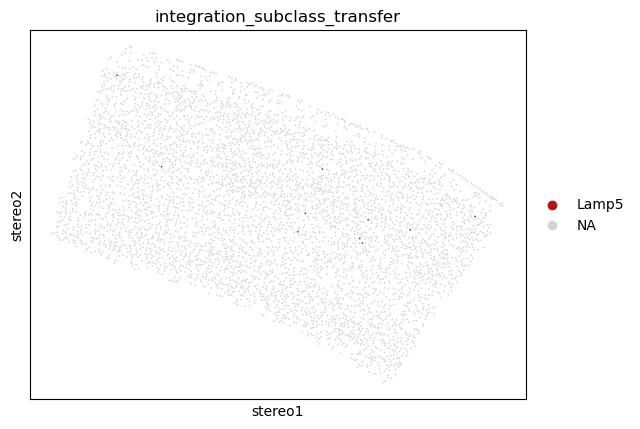

View of AnnData object with n_obs × n_vars = 10 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_u

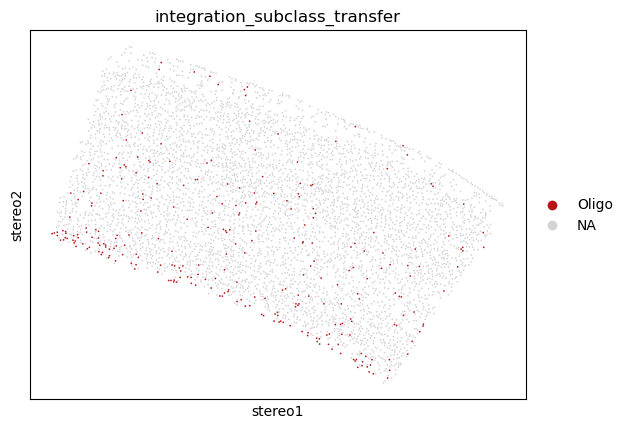

View of AnnData object with n_obs × n_vars = 284 × 26102
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Class_new', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_D1-seq', 'highly_variable-V1_D1-seq', 'means-V1_D1-seq', 'dispersions-V1_D1-seq', 'dispersions_norm-V1_D1-seq', 'n_cells-V1_D2-seq', 'highly_variable-V1_D2-seq', 'means-V1_D2-seq', 'dispersions-V1_D2-seq', 'dispersions_norm-V1_D2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'integration_subclass_transfer_colors'
    obsm: 'X_harmony', 'X_pca', 'X_

In [79]:
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L2/3 IT CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L2/3 IT CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L4/5 IT CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L4/5 IT CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 IT CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L5 IT CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6 IT CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L6 IT CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 NP CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L5 NP CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 ET CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L5 ET CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6 CT CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L6 CT CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6b CTX'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='L6b CTX'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Sst'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='Sst'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['ABC'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='ABC'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Astro'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='Astro'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Pvalb'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='Pvalb'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['VLMC'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='VLMC'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['OPC'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='OPC'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Microglia'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='Microglia'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Vip'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='Vip'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Lamp5'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='Lamp5'])
sc.pl.embedding(DR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Oligo'],palette=["#b81316"])
print(DR_V1_spatial[DR_V1_spatial.obs['integration_subclass_transfer']=='Oligo'])